In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [ ]:
data = pd.read_csv("/content/dataset.csv")

In [ ]:
data

,country,date,sector,value,timestamp
0,Brazil,01/01/2019,Power,0.096799,1546300800
1,China,01/01/2019,Power,14.816100,1546300800
2,EU27 & UK,01/01/2019,Power,1.886490,1546300800
3,France,01/01/2019,Power,0.051217,1546300800
4,Germany,01/01/2019,Power,0.315002,1546300800
...,...,...,...,...,...
135403,Russia,31/05/2023,International Aviation,0.016524,1685491200
135404,Spain,31/05/2023,International Aviation,0.068408,1685491200
135405,UK,31/05/2023,International Aviation,0.103774,1685491200
135406,US,31/05/2023,International Aviation,0.200409,1685491200


In [ ]:
country_stats = data.groupby('country')['value'].agg(['mean', 'sum', 'count'])
sector_stats = data.groupby('sector')['value'].agg(['mean', 'sum', 'count'])

In [ ]:
country_stats

,mean,sum,count
country,,,
Brazil,0.189875,1836.474832,9672
China,4.963097,48003.071381,9672
EU27 & UK,1.447901,14004.102835,9672
France,0.137354,1328.491333,9672
Germany,0.305109,2951.018676,9672
India,1.148466,11107.959325,9672
Italy,0.147137,1423.104886,9672
Japan,0.488268,4722.530409,9672
ROW,4.796590,46392.618476,9672


In [ ]:
sector_stats

,mean,sum,count
sector,,,
Domestic Aviation,0.125072,2822.618346,22568
Ground Transport,2.574027,58090.650904,22568
Industry,4.312522,97324.986200,22568
International Aviation,0.187936,4241.328900,22568
Power,5.463784,123306.678317,22568
Residential,1.493293,33700.627980,22568


In [ ]:
from scipy.stats import ttest_ind

group1 = data[data['country'] == 'Russia']['value']
group2 = data[data['country'] == 'China']['value']

t_stat, p_value = ttest_ind(group1, group2)

In [ ]:
t_stat

-72.74041149136355

In [ ]:
p_value

0.0

In [ ]:
from scipy.stats import zscore

data['z_score'] = zscore(data['value'])
outliers = data[abs(data['z_score']) > 3]

In [ ]:
outliers

,country,date,sector,value,timestamp,z_score
13,WORLD,01/01/2019,Power,36.8332,1546300800,5.834545
27,WORLD,02/01/2019,Power,39.1125,1546387200,6.220307
41,WORLD,03/01/2019,Power,39.7868,1546473600,6.334430
55,WORLD,04/01/2019,Power,40.4257,1546560000,6.442561
69,WORLD,05/01/2019,Power,39.1776,1546646400,6.231325
...,...,...,...,...,...,...
45121,WORLD,30/05/2023,Industry,31.7332,1685404800,4.971391
45135,WORLD,31/05/2023,Industry,32.2888,1685491200,5.065424
83341,WORLD,21/01/2022,Residential,20.6915,1642723200,3.102627
83355,WORLD,22/01/2022,Residential,20.1061,1642809600,3.003551


In [ ]:
percentiles = data['value'].quantile([0.25, 0.5, 0.75])
percentiles

0.25    0.078661
0.50    0.314597
0.75    1.636632
Name: value, dtype: float64

In [ ]:
kurt = data['value'].kurtosis()
skew = data['value'].skew()

kurt

19.43887149028586

In [ ]:
skew

4.194554784521429

In [ ]:
data.isnull().sum()

country      0
date         0
sector       0
value        0
timestamp    0
z_score      0
dtype: int64

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 135408 entries, 0 to 135407
Data columns (total 6 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   country    135408 non-null  object 
 1   date       135408 non-null  object 
 2   sector     135408 non-null  object 
 3   value      135408 non-null  float64
 4   timestamp  135408 non-null  int64  
 5   z_score    135408 non-null  float64
dtypes: float64(2), int64(1), object(3)
memory usage: 6.2+ MB


In [ ]:
data.describe()

,value,timestamp,z_score
count,135408.000000,1.354080e+05,1.354080e+05
mean,2.359439,1.615896e+09,3.022514e-17
std,5.908582,4.020589e+07,1.000004e+00
min,0.000078,1.546301e+09,-3.993123e-01
25%,0.078661,1.581098e+09,-3.860125e-01
50%,0.314597,1.615896e+09,-3.460813e-01
75%,1.636632,1.650694e+09,-1.223321e-01
max,46.263500,1.685491e+09,7.430585e+00


In [ ]:
# Find unique values in the 'sector' column
unique_sectors = data['sector'].unique()
# Display the unique values
print(unique_sectors)

['Power' 'Industry' 'Ground Transport' 'Residential' 'Domestic Aviation'
 'International Aviation']


In [ ]:
# Find unique values in the 'sector' column
unique_sectors = data['country'].unique()
# Display the unique values
print(unique_sectors)

['Brazil' 'China' 'EU27 & UK' 'France' 'Germany' 'India' 'Italy' 'Japan'
 'ROW' 'Russia' 'Spain' 'UK' 'US' 'WORLD']


In [ ]:
def get_unique_values(input_df):

    result_data = []

    for column in input_df.columns:

        # If the number of unique values in the column is less than or equal to 10
        if input_df.loc[:, column].nunique() <= 10:
            # Get the unique values in the column
            unique_values = input_df.loc[:, column].unique()
            # Append the column name, number of unique values, unique values, and data type to the result data
            result_data.append([column, input_df.loc[:, column].nunique(), unique_values, input_df.loc[:, column].dtype])
        else:
            # Otherwise, append only the column name, number of unique values, and data type to the result data
            result_data.append([column, input_df.loc[:, column].nunique(), "-", input_df.loc[:, column].dtype])

    result_df = pd.DataFrame(result_data, columns=['Column Name', 'Number of Unique Values', ' Unique Values ', 'Data Type'])

    return result_df

# Assuming 'data' is your DataFrame
get_unique_values(data)

,Column Name,Number of Unique Values,Unique Values,Data Type
0,country,14,-,object
1,date,1612,-,object
2,sector,6,"[Power, Industry, Ground Transport, Residentia...",object
3,value,127135,-,float64
4,timestamp,1612,-,int64
5,z_score,127135,-,float64


In [ ]:
# Assuming 'data' is your DataFrame
co2_country = data.groupby('country').sum(numeric_only=True)['value'].reset_index()
co2_country = co2_country.sort_values(by='value')
# Choose a different color for the bar graph
bar_color = 'rgba(0, 128, 255, 0.6)'  # Blue color

# Create the bar graph
fig = go.Figure(data=[go.Bar(x=co2_country['country'], y=co2_country['value'], marker=dict(color=bar_color))])

# Customize the layout
fig.update_layout(
    title="Total CO2 Emission by Country since 2019",
    xaxis_title="Country",
    yaxis_title="CO2 Emissions (MtCO2/day)",
)

# Display the graph
fig.show()

In [ ]:
# Assuming 'co2_emissions_by_country' is your DataFrame
filtered_co2_emissions = co2_country[~co2_country['country'].isin(['WORLD', 'ROW', 'EU27 & UK'])]

# Choose a different color scale for the choropleth map
color_scale = 'Blues'

fig = px.choropleth(filtered_co2_emissions, locations='country', locationmode='country names', color='value',
                    hover_name='country', color_continuous_scale=color_scale, projection='natural earth')

# Customize the layout
fig.update_layout(
    title="Total CO2 Emission by Country (Excluding WORLD, ROW, EU27 & UK)",
    geo=dict(
        showframe=False,
        showcoastlines=False,
    )
)

# Display the graph
fig.show()

#### EDA Based on Sectors

In [ ]:
# Assuming 'data_world' is your DataFrame
world_data = data[data['country'] == 'WORLD']

sector_emissions = world_data.groupby('sector').sum(numeric_only=True)['value'].reset_index()

sector_emissions = sector_emissions.sort_values(by='value')

# Choose a different color for the bar graph
bar_color = 'rgba(0, 128, 255, 0.6)'  # Blue color

# Create the bar graph
fig = go.Figure(data=[go.Bar(x=sector_emissions['sector'], y=sector_emissions['value'], marker=dict(color=bar_color))])

# Customize the layout
fig.update_layout(
    title="Global CO2 Emission by Sector since 2019",
    xaxis_title="Sector",
    yaxis_title="CO2 Emissions (MtCO2/day)",
)

# Show the plot
fig.show()

In [ ]:
# Assuming 'data_world' is your DataFrame
world_data = data[data['country'] == 'WORLD']

# Choose a different color for the box plot
box_color = 'rgba(255, 69, 0, 0.6)'  # Red-Orange color

# Create a box plot using Plotly Express
fig = px.box(world_data, x='sector', y='value',
             title="Box Plot of Global CO2 Emissions by Sector",
             labels={'value': 'CO2 Emissions (MtCO2/day)', 'sector': 'Sector'},
             boxmode='overlay',  # Display boxes on top of each other
             color_discrete_sequence=[box_color])

# Display the graph
fig.show()

In [ ]:
# Assuming 'data_world' is your DataFrame
world_data = data[data['country'] == 'WORLD']

# Choose a different color scale for the time series plot
color_scale = 'Viridis'

# Create a time series graph using Plotly Express
fig = px.line(world_data, x='date', y='value', color='sector',
              title="Time Series Plot of Global CO2 Emissions by Sector",
              labels={'value': 'CO2 Emissions (MtCO2/day)', 'sector': 'Sector', 'date': 'Date'},
              line_group='sector',  # Separate lines by sector
              color_discrete_sequence=px.colors.colorbrewer.Set1)

# Display the graph
fig.show()

In [ ]:
# Define a dictionary to map each sector to a color with modified opacity
sector_colors = {
    'Power': 'rgba(0, 0, 255, 0.6)',             # Blue
    'Industry': 'rgba(255, 127, 14, 0.6)',       # Orange
    'Ground Transport': 'rgba(0, 128, 0, 0.6)',  # Green
    'Residential': 'rgba(255, 0, 0, 0.6)',       # Red
    'Domestic Aviation': 'rgba(128, 0, 128, 0.6)', # Purple
    'International Aviation': 'rgba(165, 42, 42, 0.6)' # Brown
}

def plot_country_and_sector_emissions(fig, country_data, row):
    for sector, sector_data in country_data.groupby('sector'):
        fig.add_trace(
            go.Scatter(
                x=sector_data['date'],
                y=sector_data['value'],
                mode='lines',
                line=dict(width=2, color=sector_colors[sector]),
                name=sector,
                showlegend=(row == 1)  # Show legend only for the first country
            ),
            row=row, col=1
        )

# Get a list of unique countries
unique_countries = data['country'].unique()

# Create subplots with one column and a number of rows based on the number of unique countries
fig = make_subplots(
    rows=len(unique_countries),
    cols=1,
    subplot_titles=[f"{country} CO2 Emissions by Sector" for country in unique_countries]
)

# Plot data for each country in separate subplots
for i, country in enumerate(unique_countries):
    country_data = data[data['country'] == country]
    plot_country_and_sector_emissions(fig, country_data, row=i + 1)

# Update layout and display the graph
fig.update_layout(
    showlegend=True,
    height=6000,
    title_text="CO2 Emissions by Sector for Different Countries"
)

fig.show()

In [ ]:
# Assuming 'data' is your DataFrame
emissions_by_country_sector = data.groupby(['country', 'sector']).sum(numeric_only=True)['value'].reset_index()
emissions_by_country_sector = emissions_by_country_sector[~emissions_by_country_sector['country'].isin(['WORLD'])]

# Choose a different color scale for the faceted bar chart
color_scale = px.colors.qualitative.Set1

# Create a faceted bar chart using Plotly Express
fig = px.bar(emissions_by_country_sector, x='country', y='value', color='sector', barmode='group',
             title="CO2 Emission by Country & Sector since 2019",
             labels={'value': 'CO2 Emissions (MtCO2/day)', 'country': 'Country', 'sector': 'Sector'},
             color_discrete_sequence=color_scale)

# Display the graph
fig.show()

#### Co2 Emission for Each Year

In [ ]:
# Assuming 'data_world' is your DataFrame
world_data = data[data['country'] == 'WORLD']
df = world_data.groupby('date').sum(numeric_only=True)['value'].reset_index()  # Group by date

# Convert 'date' column to datetime type with the correct format
df['date'] = pd.to_datetime(df['date'], format='%d/%m/%Y')

df = df.sort_values(by='date')  # Sort values by date

# Extract year from each data point
df['Year'] = df['date'].dt.year

In [ ]:
# Create subplots for each year
fig = make_subplots(rows=len(df['Year'].unique()), cols=1, shared_xaxes=True,
                    subplot_titles=[f"Year {year}" for year in df['Year'].unique()],
                    vertical_spacing=0.1)

# Choose a different color for the lines
line_color = 'rgba(0, 128, 0, 0.8)'  # Green color

# Create separate graphs for each year
for idx, year in enumerate(df['Year'].unique(), 1):
    df_year = df[df['Year'] == year]

    fig.add_trace(
        go.Scatter(
            x=df_year['date'].dt.dayofyear,
            y=df_year['value'],
            mode='lines',
            name=str(year),
            hovertext=df_year['date'].dt.strftime('%Y-%m-%d'),
            hoverinfo='text+y',
            line=dict(color=line_color)
        ),
        row=idx,
        col=1
    )

    # Update layout for each subplot
    fig.update_xaxes(title_text="Date", row=idx, col=1)
    fig.update_yaxes(title_text="CO2 Emission", row=idx, col=1)

    # Set the x-axis tick positions and labels to be the first day of each month
    month_starts = pd.date_range(start=f'{year}-01-01', end=f'{year}-12-01', freq='MS')
    tickvals = month_starts.dayofyear
    ticktext = month_starts.strftime('%b')

    fig.update_xaxes(row=idx, col=1, tickvals=tickvals, ticktext=ticktext)

# Update the overall layout
fig.update_layout(
    title="Global CO2 Emission Time Series for Each Year",
    showlegend=False,
    height=1500
)

# Show the plot
fig.show()

In [ ]:
# Assuming 'data_world' is your DataFrame
world_data = data[data['country'] == 'WORLD']
df = world_data.groupby('date').sum(numeric_only=True)['value'].reset_index()  # Group by date
# Convert 'date' column to datetime type with the correct format
df['date'] = pd.to_datetime(df['date'], format='%d/%m/%Y')

df = df.sort_values(by='date')  # Sort values by date

# Extract year from each data point
df['Year'] = df['date'].dt.year
today = pd.to_datetime('today')
df = df[df['date'] <= today]

In [ ]:
# Create a color scale for the number of unique years
color_scale = px.colors.qualitative.Set1

# Create a single graph for all years
fig = go.Figure()

# Add traces for each year to the same graph with a different color
for idx, year in enumerate(df['Year'].unique()):
    df_year = df[df['Year'] == year]

    fig.add_trace(
        go.Scatter(
            x=df_year['date'],
            y=df_year['value'],
            mode='lines',
            name=str(year),
            hoverinfo='x+y',
            line=dict(color=color_scale[idx])
        )
    )

# Update layout for the graph
fig.update_layout(
    title="Global CO2 Emission Time Series",
    xaxis_title="Date",
    yaxis_title="CO2 Emission (MtCO2/day)",
    showlegend=True,
    height=800
)

# Show the plot
fig.show()

In [ ]:
def plot_country_emissions(input_country):
    country_data = data[data['country'] == input_country]
    df = country_data.groupby('date').sum(numeric_only=True)['value'].reset_index()
    # Convert 'date' column to datetime type with the correct format
    df['date'] = pd.to_datetime(df['date'], format='%d/%m/%Y')

    df = df.sort_values(by='date')  # Sort values by date

    df['Year'] = df['date'].dt.year

    # Define a list of colors with transparency (alpha)
    color_palette = {
        2021: 'rgba(255, 69, 0, 0.3)',  # Red-Orange color
        2022: 'rgba(0, 128, 0, 0.5)',   # Green color
        2023: 'rgba(0, 0, 255, 0.6)'    # Blue color
    }

    fig = go.Figure()

    for year in [2021, 2022, 2023]:
        df_year = df[df['Year'] == year]
        fig.add_trace(go.Scatter(
            x=df_year['date'].dt.dayofyear,
            y=df_year['value'],
            mode='lines',
            hovertext=df_year['date'].dt.strftime('%Y-%m-%d'),
            hoverinfo='text+y',
            line_shape='linear',
            line=dict(color=color_palette[year]),
            name=str(year)
        ))

        # Set the x-axis tick positions and labels to be the first day of each month
        month_starts = pd.date_range(start=f'{year}-01-01', end=f'{year}-12-01', freq='MS')
        tickvals = month_starts.dayofyear
        ticktext = month_starts.strftime('%b')
        fig.update_xaxes(tickvals=tickvals, ticktext=ticktext)

    # Update the layout
    fig.update_layout(
        title= input_country + " CO2 Emission Time Series",
        xaxis=dict(title="Month", tickformat="%b"),
        yaxis=dict(title="CO2 Emission (MtCO2/day)"),
        legend_title="Year",
        hovermode='x',
    )

    # Show the plot
    fig.show()

# Apply the function for each unique country in the dataset
for country_name in data['country'].unique():
    plot_country_emissions(country_name)

###zssrgd

In [ ]:
# Assuming 'data' is your DataFrame
#data['date'] = pd.to_datetime(data['date'])
# Convert 'date' column to datetime type with the correct format
data['date'] = pd.to_datetime(data['date'], format='%d/%m/%Y')
data = data.sort_values(by='date')  # Sort values by date

# Extract year from each data point
data['Year'] = data['date'].dt.year

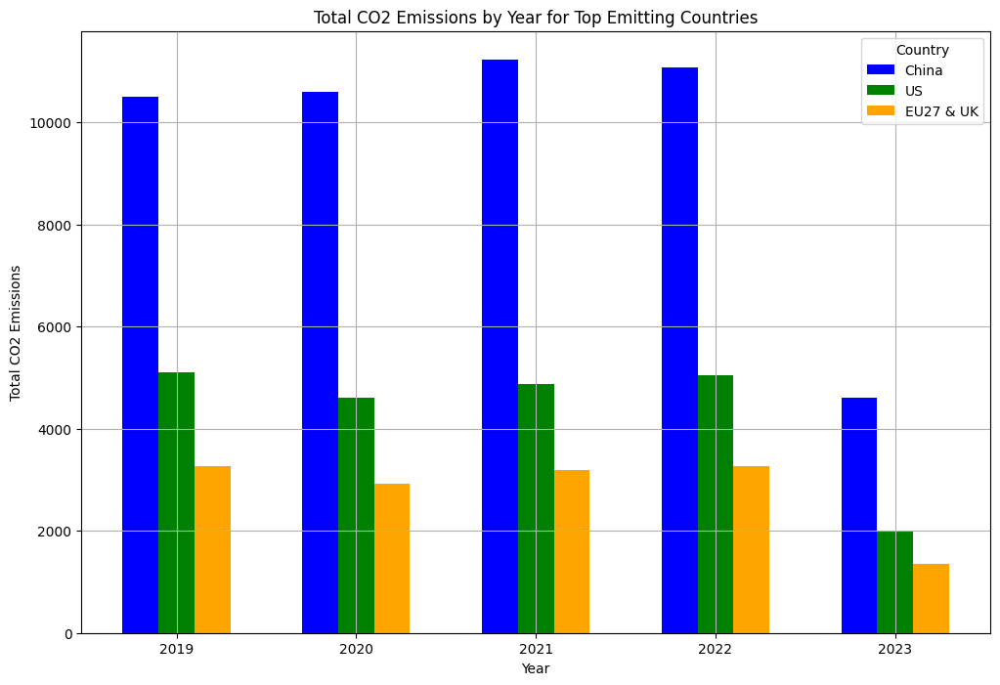

In [ ]:
# Assuming 'data' is your DataFrame
top_countries = ['China', 'US', 'EU27 & UK']

# Aggregate total CO2 emissions by year and country for the top countries
total_emissions_by_year_country = data[data['country'].isin(top_countries)].groupby(['Year', 'country'])['value'].sum().unstack()

# Choose a different color palette for the bar plot
color_palette = ['blue', 'green', 'orange']

# Plot total CO2 emissions by year for each top country using a bar plot
plt.figure(figsize=(12, 8))

bar_width = 0.2
bar_positions = np.arange(len(total_emissions_by_year_country.index))

for i, country in enumerate(top_countries):
    plt.bar(bar_positions + i * bar_width, total_emissions_by_year_country[country],
            width=bar_width, label=country, color=color_palette[i])

plt.title('Total CO2 Emissions by Year for Top Emitting Countries')
plt.xlabel('Year')
plt.ylabel('Total CO2 Emissions')
plt.xticks(bar_positions + (len(top_countries) - 1) * bar_width / 2, total_emissions_by_year_country.index)
plt.legend(title='Country')
plt.grid(True)
plt.show()

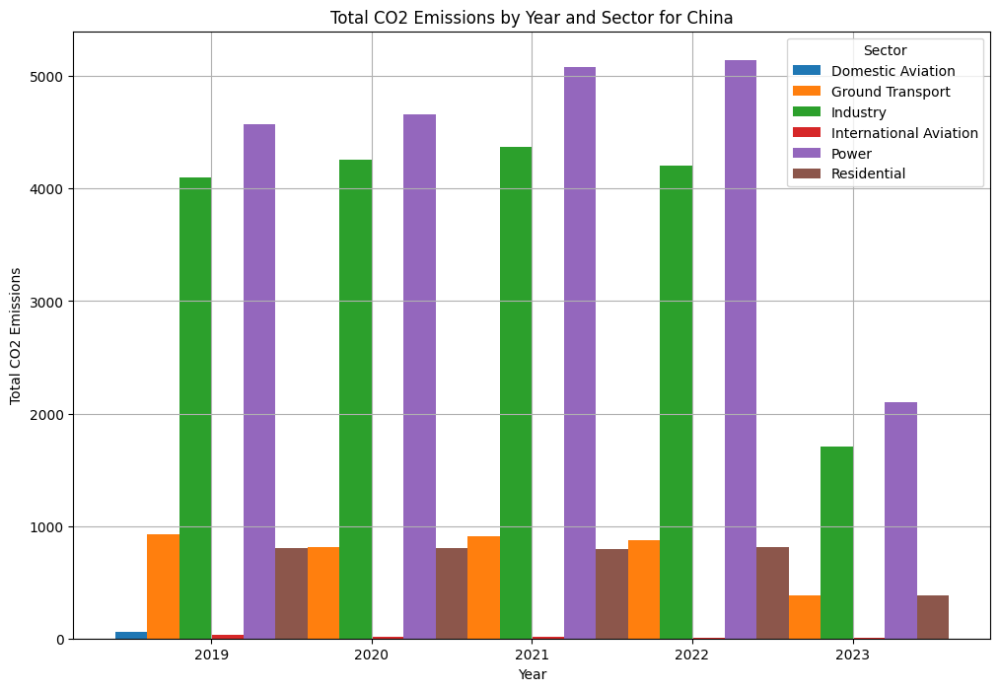

In [ ]:
# Assuming 'data' is your DataFrame
china_data = data[data['country'] == 'China']

# Aggregate total CO2 emissions by year, sector, and country for China
total_emissions_by_year_sector_china = china_data.groupby(['Year', 'sector'])['value'].sum().unstack()

# Choose a different color palette for the bar plot
color_palette = plt.cm.tab10.colors

# Plot total CO2 emissions by year for each sector in China using a bar plot
plt.figure(figsize=(12, 8))

bar_width = 0.2
bar_positions = np.arange(len(total_emissions_by_year_sector_china.index))

for i, sector in enumerate(total_emissions_by_year_sector_china.columns):
    plt.bar(bar_positions + i * bar_width, total_emissions_by_year_sector_china[sector],
            width=bar_width, label=sector, color=color_palette[i])

plt.title('Total CO2 Emissions by Year and Sector for China')
plt.xlabel('Year')
plt.ylabel('Total CO2 Emissions')
plt.xticks(bar_positions + (len(total_emissions_by_year_sector_china.columns) - 1) * bar_width / 2,
           total_emissions_by_year_sector_china.index)
plt.legend(title='Sector')
plt.grid(True)
plt.show()

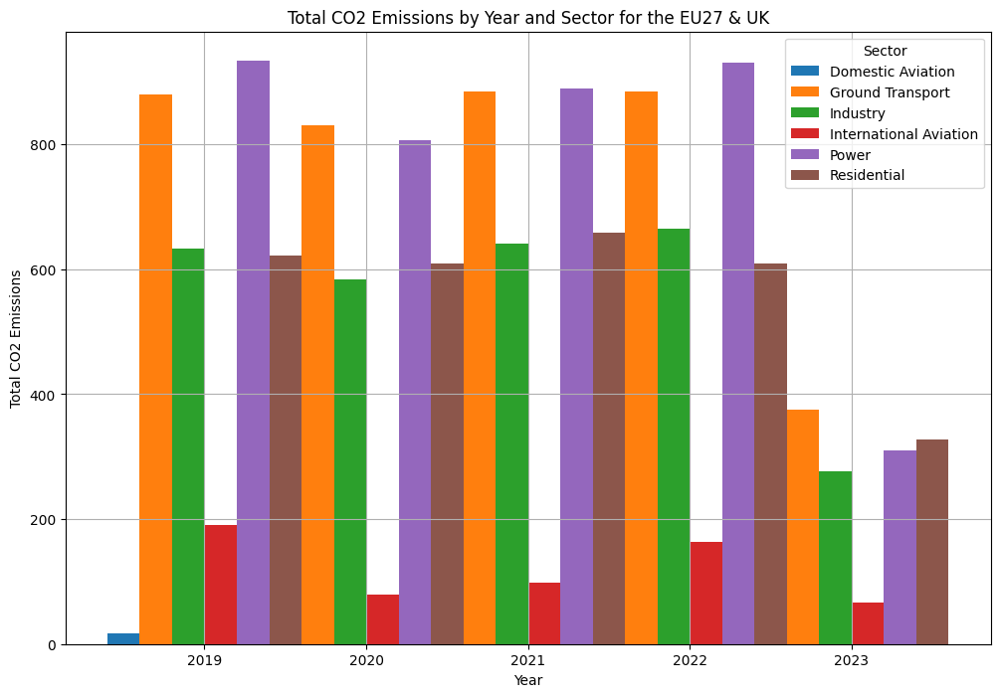

In [ ]:
# Assuming 'data' is your DataFrame
uk_data = data[data['country'] == 'EU27 & UK']

# Aggregate total CO2 emissions by year, sector, and country for the US
total_emissions_sector_uk = uk_data.groupby(['Year', 'sector'])['value'].sum().unstack()

# Choose a different color palette for the bar plot
color_palette = plt.cm.tab10.colors
# Plot total CO2 emissions by year for each sector in the US using a bar plot
plt.figure(figsize=(12, 8))

bar_width = 0.2
bar_positions = np.arange(len(total_emissions_sector_uk.index))

for i, sector in enumerate(total_emissions_sector_uk.columns):
    plt.bar(bar_positions + i * bar_width, total_emissions_sector_uk[sector],
            width=bar_width, label=sector, color=color_palette[i])

plt.title('Total CO2 Emissions by Year and Sector for the EU27 & UK')
plt.xlabel('Year')
plt.ylabel('Total CO2 Emissions')
plt.xticks(bar_positions + (len(total_emissions_sector_uk.columns) - 1) * bar_width / 2,
           total_emissions_sector_uk.index)
plt.legend(title='Sector')
plt.grid(True)
plt.show()

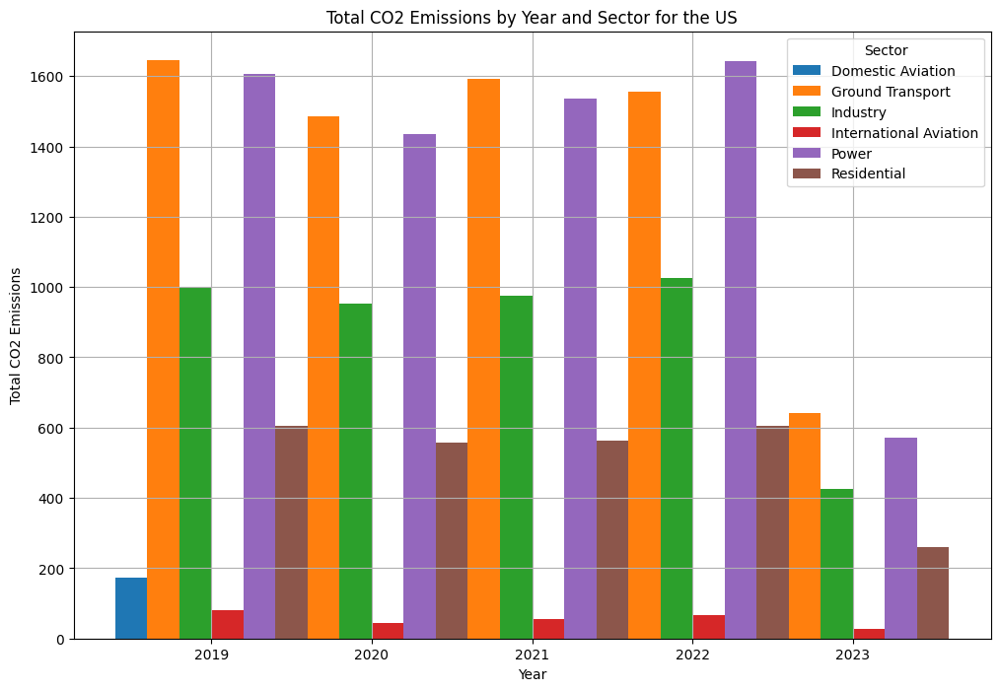

In [ ]:
# Assuming 'data' is your DataFrame
us_data = data[data['country'] == 'US']

# Aggregate total CO2 emissions by year, sector, and country for the US
total_emissions_sector_us = us_data.groupby(['Year', 'sector'])['value'].sum().unstack()

# Choose a different color palette for the bar plot
color_palette = plt.cm.tab10.colors

# Plot total CO2 emissions by year for each sector in the US using a bar plot
plt.figure(figsize=(12, 8))

bar_width = 0.2
bar_positions = np.arange(len(total_emissions_sector_us.index))

for i, sector in enumerate(total_emissions_sector_us.columns):
    plt.bar(bar_positions + i * bar_width, total_emissions_sector_us[sector],
            width=bar_width, label=sector, color=color_palette[i])

plt.title('Total CO2 Emissions by Year and Sector for the US')
plt.xlabel('Year')
plt.ylabel('Total CO2 Emissions')
plt.xticks(bar_positions + (len(total_emissions_sector_us.columns) - 1) * bar_width / 2,
           total_emissions_sector_us.index)
plt.legend(title='Sector')
plt.grid(True)
plt.show()

<ipython-input-38-6976dafb052f>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



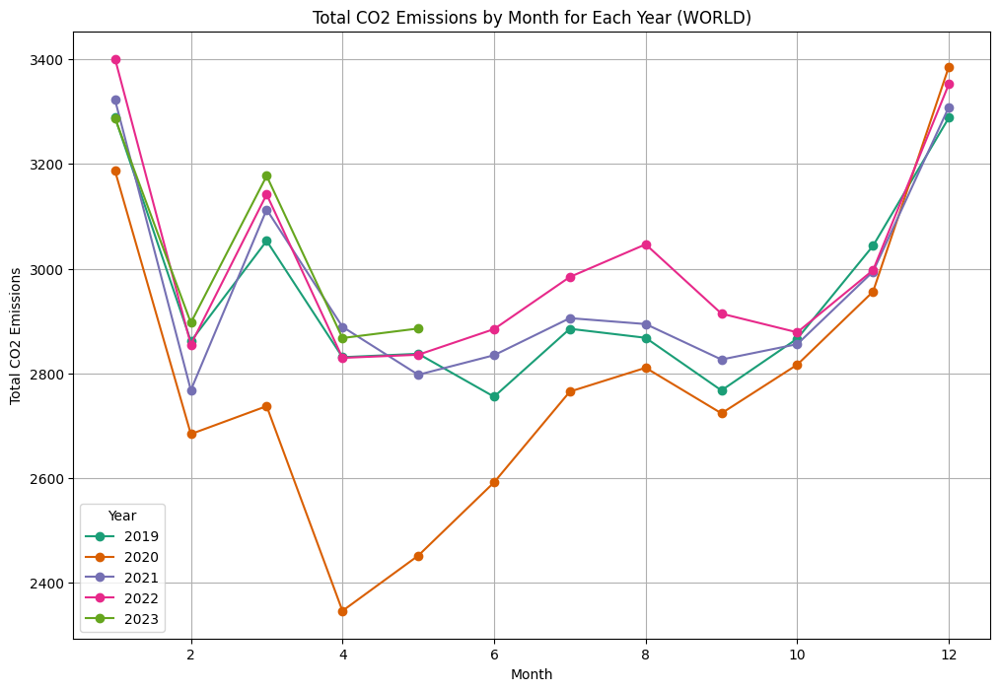

In [ ]:
# Assuming 'data' is your DataFrame
world_data = data[data['country'] == 'WORLD']

# Create a 'month' column for easy monthly aggregation
world_data['month'] = world_data['date'].dt.month

# Aggregate total CO2 emissions by year and month for the 'WORLD' category
total_emissions_month_world = world_data.groupby(['Year', 'month'])['value'].sum().unstack()

# Choose a different color palette for the line plot
color_palette = plt.cm.Dark2.colors

# Plot total CO2 emissions by month for each year for the 'WORLD' category using a line plot
plt.figure(figsize=(12, 8))

for i, year in enumerate(total_emissions_month_world.index):
    plt.plot(total_emissions_month_world.columns, total_emissions_month_world.loc[year],
             marker='o', label=year, color=color_palette[i])

plt.title('Total CO2 Emissions by Month for Each Year (WORLD)')
plt.xlabel('Month')
plt.ylabel('Total CO2 Emissions')
plt.legend(title='Year')
plt.grid(True)
plt.show()

<ipython-input-39-f4f5a9bf0f17>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



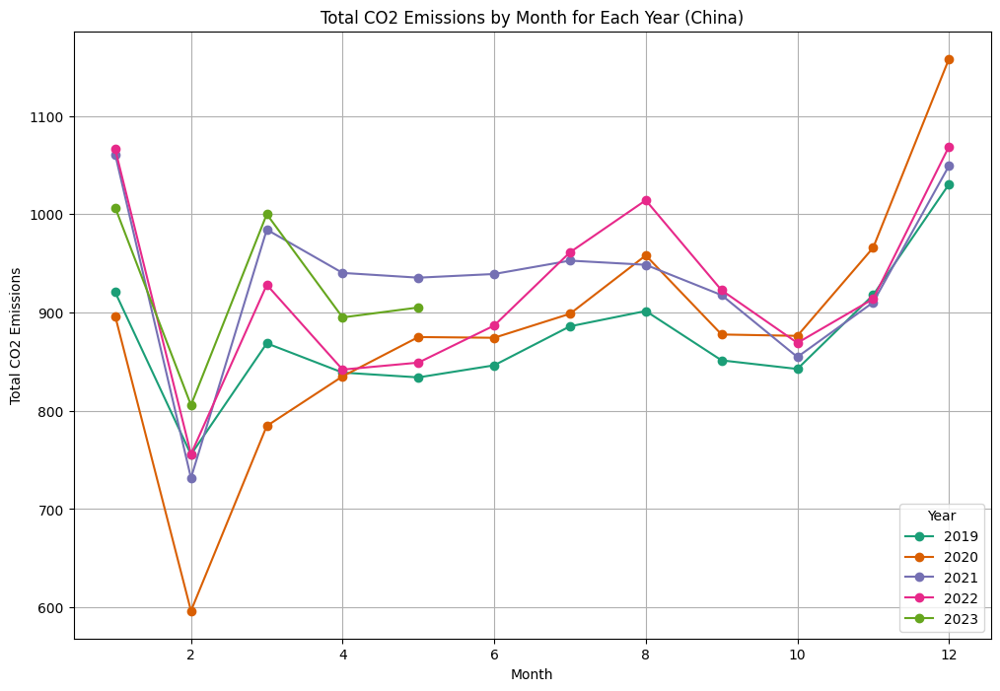

In [ ]:
# Assuming 'data' is your DataFrame
china_data = data[data['country'] == 'China']

# Create a 'month' column for easy monthly aggregation
china_data['month'] = china_data['date'].dt.month

# Aggregate total CO2 emissions by year and month for the 'WORLD' category
total_emissions_month_china = china_data.groupby(['Year', 'month'])['value'].sum().unstack()

# Choose a different color palette for the line plot
color_palette = plt.cm.Dark2.colors

# Plot total CO2 emissions by month for each year for the 'WORLD' category using a line plot
plt.figure(figsize=(12, 8))

for i, year in enumerate(total_emissions_month_china.index):
    plt.plot(total_emissions_month_china.columns, total_emissions_month_china.loc[year],
             marker='o', label=year, color=color_palette[i])

plt.title('Total CO2 Emissions by Month for Each Year (China)')
plt.xlabel('Month')
plt.ylabel('Total CO2 Emissions')
plt.legend(title='Year')
plt.grid(True)
plt.show()

<ipython-input-40-495b9474992b>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



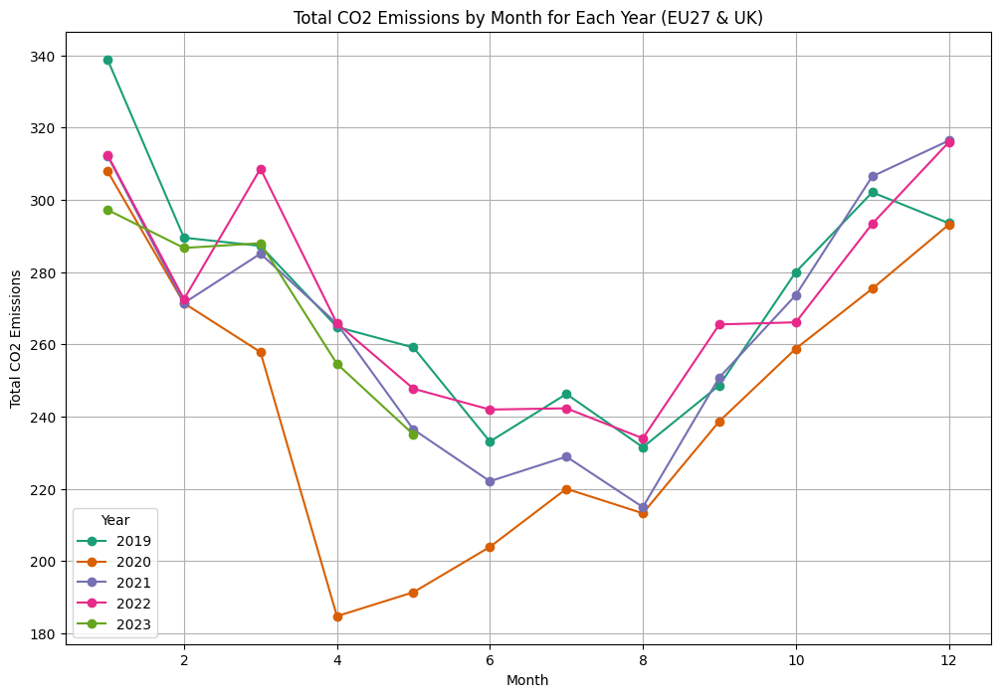

In [ ]:
# Assuming 'data' is your DataFrame
uk_data = data[data['country'] == 'EU27 & UK']

# Create a 'month' column for easy monthly aggregation
uk_data['month'] = uk_data['date'].dt.month

# Aggregate total CO2 emissions by year and month for the 'WORLD' category
total_emissions_month_uk = uk_data.groupby(['Year', 'month'])['value'].sum().unstack()

# Choose a different color palette for the line plot
color_palette = plt.cm.Dark2.colors

# Plot total CO2 emissions by month for each year for the 'WORLD' category using a line plot
plt.figure(figsize=(12, 8))

for i, year in enumerate(total_emissions_month_uk.index):
    plt.plot(total_emissions_month_uk.columns, total_emissions_month_uk.loc[year],
             marker='o', label=year, color=color_palette[i])

plt.title('Total CO2 Emissions by Month for Each Year (EU27 & UK)')
plt.xlabel('Month')
plt.ylabel('Total CO2 Emissions')
plt.legend(title='Year')
plt.grid(True)
plt.show()

<ipython-input-41-d4cd7b682281>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



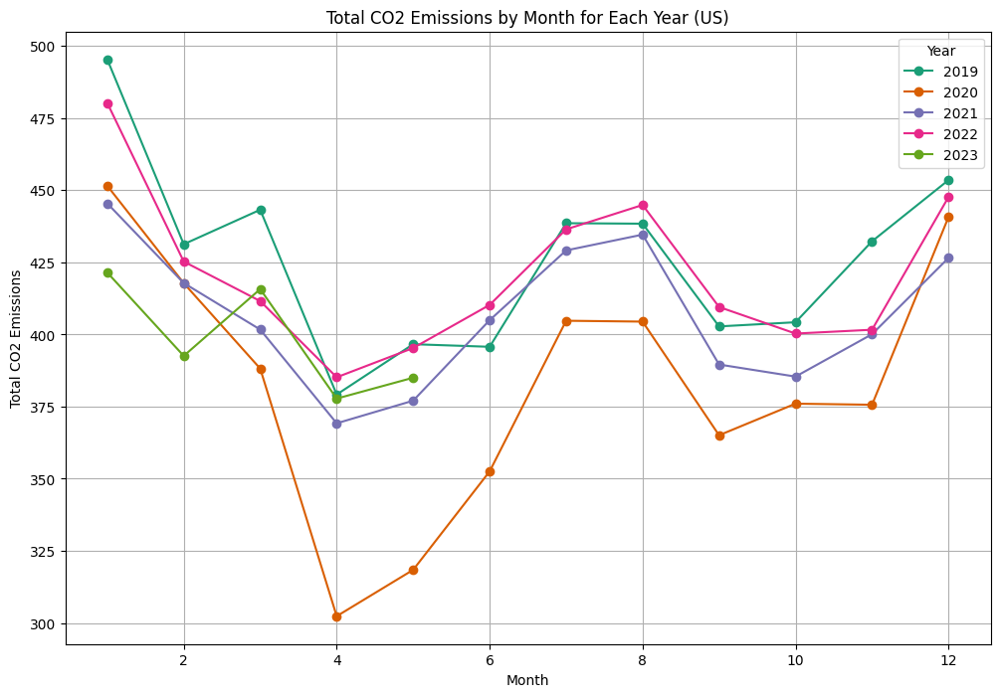

In [ ]:
# Assuming 'data' is your DataFrame
us_data = data[data['country'] == 'US']

# Create a 'month' column for easy monthly aggregation
us_data['month'] = us_data['date'].dt.month

# Aggregate total CO2 emissions by year and month for the 'WORLD' category
total_emissions_month_us = us_data.groupby(['Year', 'month'])['value'].sum().unstack()

# Choose a different color palette for the line plot
color_palette = plt.cm.Dark2.colors

# Plot total CO2 emissions by month for each year for the 'WORLD' category using a line plot
plt.figure(figsize=(12, 8))

for i, year in enumerate(total_emissions_month_us.index):
    plt.plot(total_emissions_month_us.columns, total_emissions_month_us.loc[year],
             marker='o', label=year, color=color_palette[i])

plt.title('Total CO2 Emissions by Month for Each Year (US)')
plt.xlabel('Month')
plt.ylabel('Total CO2 Emissions')
plt.legend(title='Year')
plt.grid(True)
plt.show()

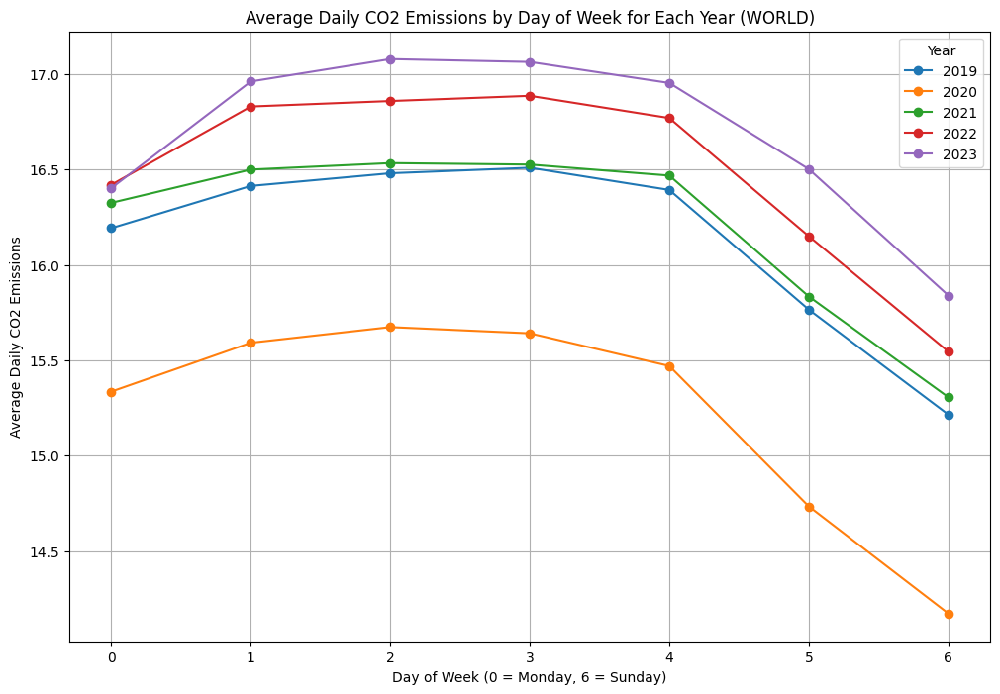

In [ ]:
# Create a 'day_of_week' column (0 = Monday, 6 = Sunday)
data['day_of_week'] = data['date'].dt.dayofweek

# Aggregate average daily CO2 emissions by day of week and year for the 'WORLD' category
avg_daily_emissions_day_of_week_world = data[data['country'] == 'WORLD'].groupby(['Year', 'day_of_week'])['value'].mean().unstack()

# Plot average daily CO2 emissions by day of week for each year for the 'WORLD' category
plt.figure(figsize=(12, 8))

for year in avg_daily_emissions_day_of_week_world.index:
    plt.plot(avg_daily_emissions_day_of_week_world.columns, avg_daily_emissions_day_of_week_world.loc[year], marker='o', label=year)

plt.title('Average Daily CO2 Emissions by Day of Week for Each Year (WORLD)')
plt.xlabel('Day of Week (0 = Monday, 6 = Sunday)')
plt.ylabel('Average Daily CO2 Emissions')
plt.xticks(range(7))
plt.legend(title='Year')
plt.grid(True)
plt.show()

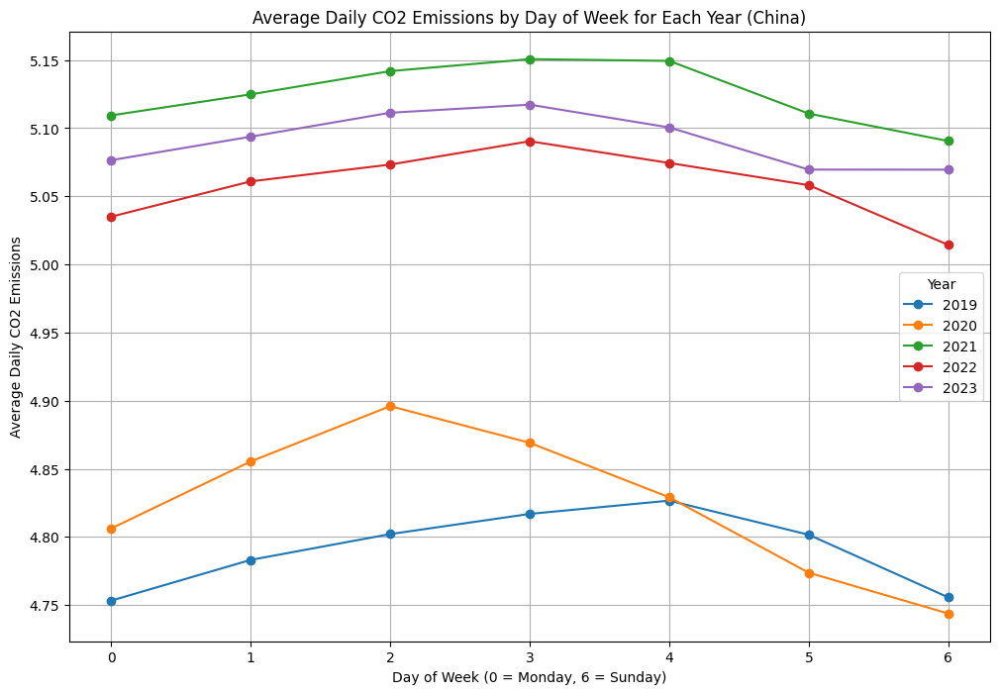

In [ ]:
# Create a 'day_of_week' column (0 = Monday, 6 = Sunday)
data['day_of_week'] = data['date'].dt.dayofweek

# Aggregate average daily CO2 emissions by day of week and year for the 'WORLD' category
avg_daily_emissions_day_of_week_china = data[data['country'] == 'China'].groupby(['Year', 'day_of_week'])['value'].mean().unstack()

# Plot average daily CO2 emissions by day of week for each year for the 'WORLD' category
plt.figure(figsize=(12, 8))

for year in avg_daily_emissions_day_of_week_china.index:
    plt.plot(avg_daily_emissions_day_of_week_china.columns, avg_daily_emissions_day_of_week_china.loc[year], marker='o', label=year)

plt.title('Average Daily CO2 Emissions by Day of Week for Each Year (China)')
plt.xlabel('Day of Week (0 = Monday, 6 = Sunday)')
plt.ylabel('Average Daily CO2 Emissions')
plt.xticks(range(7))
plt.legend(title='Year')
plt.grid(True)
plt.show()

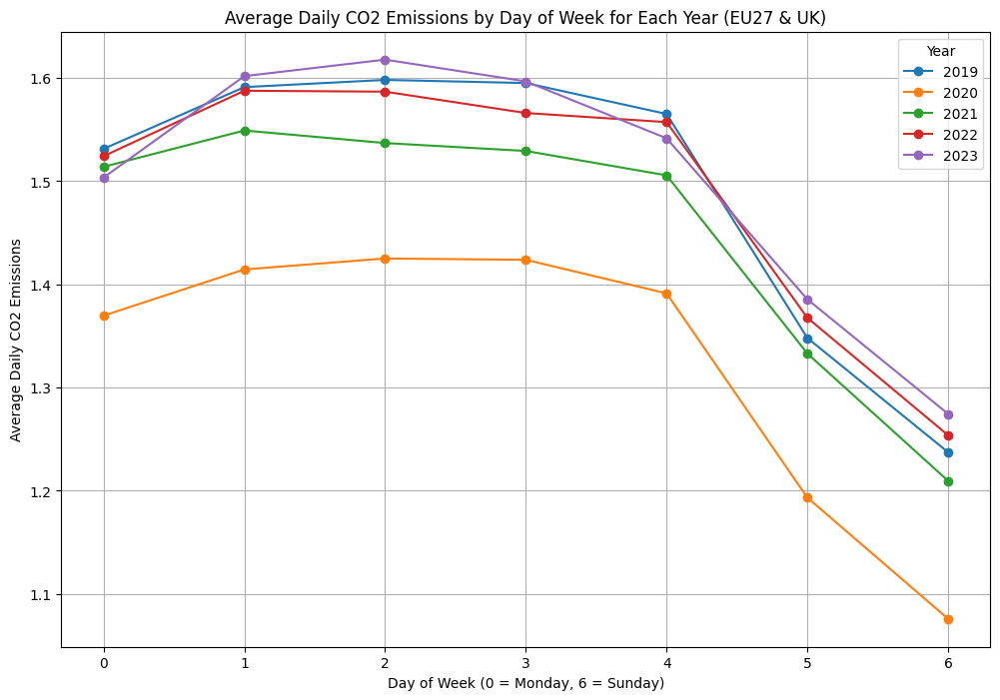

In [ ]:
# Create a 'day_of_week' column (0 = Monday, 6 = Sunday)
data['day_of_week'] = data['date'].dt.dayofweek

# Aggregate average daily CO2 emissions by day of week and year for the 'WORLD' category
avg_daily_emissions_day_of_week_uk = data[data['country'] == 'EU27 & UK'].groupby(['Year', 'day_of_week'])['value'].mean().unstack()

# Plot average daily CO2 emissions by day of week for each year for the 'WORLD' category
plt.figure(figsize=(12, 8))

for year in avg_daily_emissions_day_of_week_uk.index:
    plt.plot(avg_daily_emissions_day_of_week_uk.columns, avg_daily_emissions_day_of_week_uk.loc[year], marker='o', label=year)

plt.title('Average Daily CO2 Emissions by Day of Week for Each Year (EU27 & UK)')
plt.xlabel('Day of Week (0 = Monday, 6 = Sunday)')
plt.ylabel('Average Daily CO2 Emissions')
plt.xticks(range(7))
plt.legend(title='Year')
plt.grid(True)
plt.show()

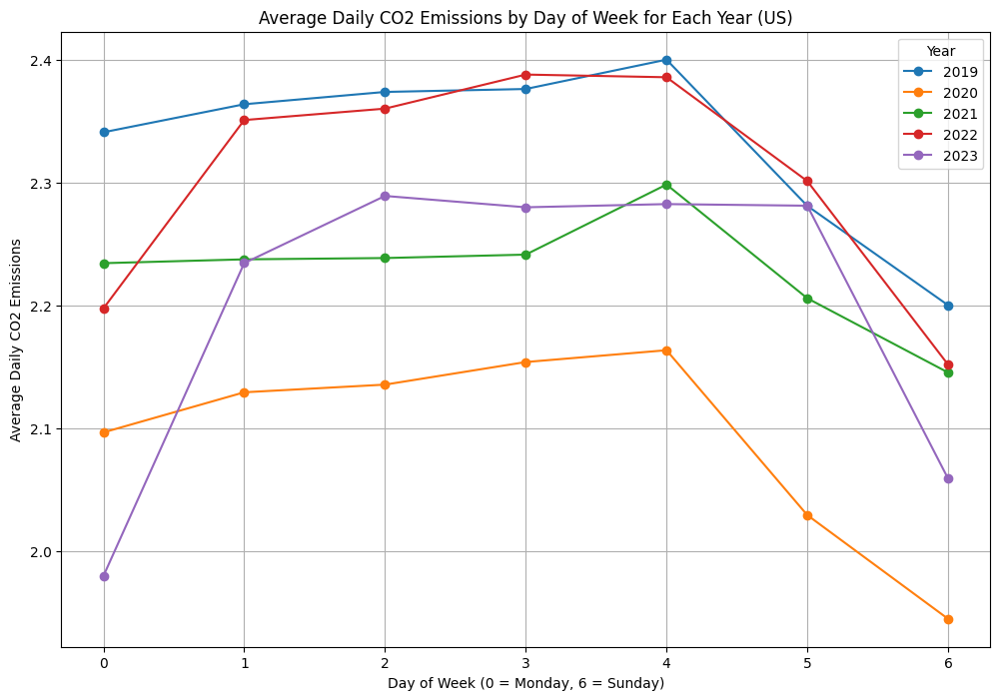

In [ ]:
# Create a 'day_of_week' column (0 = Monday, 6 = Sunday)
data['day_of_week'] = data['date'].dt.dayofweek

# Aggregate average daily CO2 emissions by day of week and year for the 'WORLD' category
avg_daily_emissions_day_of_week_us = data[data['country'] == 'US'].groupby(['Year', 'day_of_week'])['value'].mean().unstack()

# Plot average daily CO2 emissions by day of week for each year for the 'WORLD' category
plt.figure(figsize=(12, 8))

for year in avg_daily_emissions_day_of_week_us.index:
    plt.plot(avg_daily_emissions_day_of_week_us.columns, avg_daily_emissions_day_of_week_us.loc[year], marker='o', label=year)

plt.title('Average Daily CO2 Emissions by Day of Week for Each Year (US)')
plt.xlabel('Day of Week (0 = Monday, 6 = Sunday)')
plt.ylabel('Average Daily CO2 Emissions')
plt.xticks(range(7))
plt.legend(title='Year')
plt.grid(True)
plt.show()

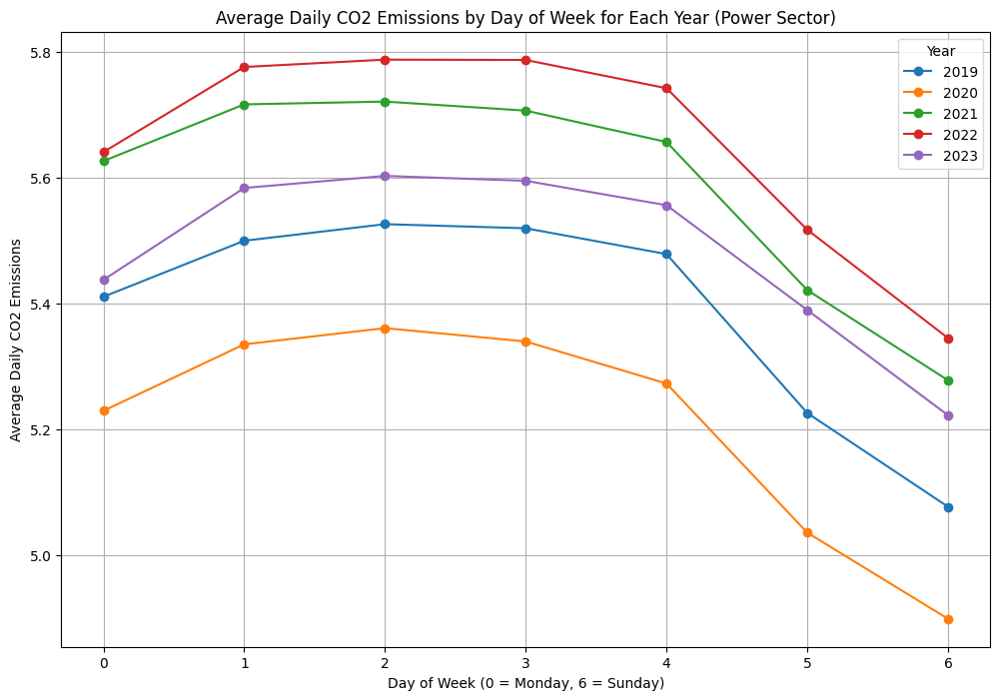

In [ ]:
# Aggregate average daily CO2 emissions by day of week and year for the Power sector
avg_daily_emissions_day_of_week_power = data[data['sector'] == 'Power'].groupby(['Year', 'day_of_week'])['value'].mean().unstack()

# Plot average daily CO2 emissions by day of week for each year for the Power sector
plt.figure(figsize=(12, 8))

for year in avg_daily_emissions_day_of_week_power.index:
    plt.plot(avg_daily_emissions_day_of_week_power.columns, avg_daily_emissions_day_of_week_power.loc[year], marker='o', label=year)

plt.title('Average Daily CO2 Emissions by Day of Week for Each Year (Power Sector)')
plt.xlabel('Day of Week (0 = Monday, 6 = Sunday)')
plt.ylabel('Average Daily CO2 Emissions')
plt.xticks(range(7))
plt.legend(title='Year')
plt.grid(True)
plt.show()

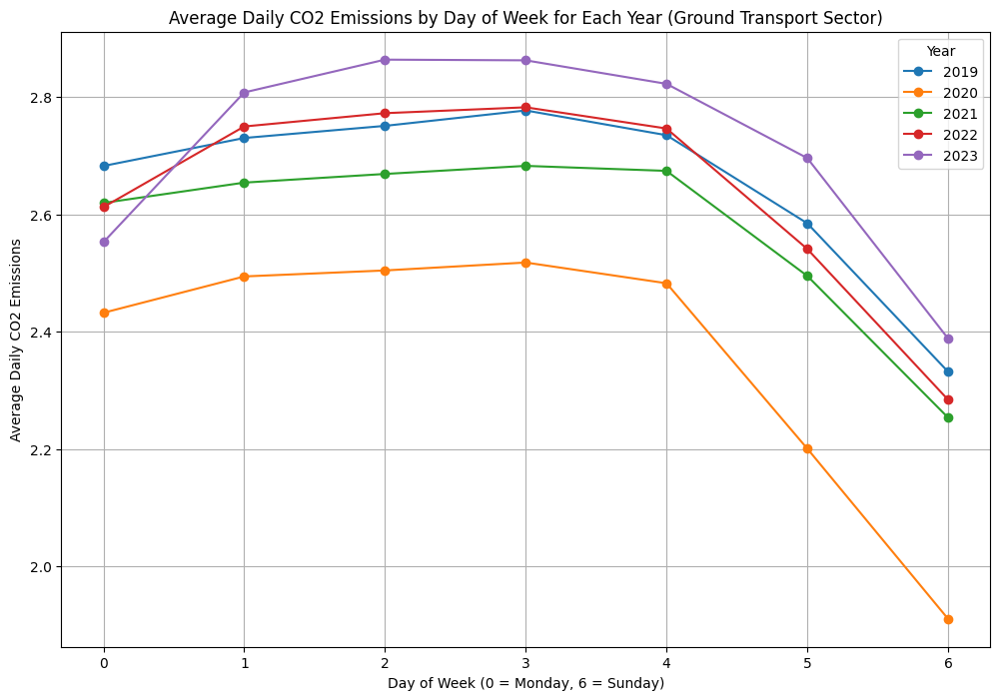

In [ ]:
# Aggregate average daily CO2 emissions by day of week and year for the Ground Transport sector
avg_daily_emissions_day_of_week_ground_transport = data[data['sector'] == 'Ground Transport'].groupby(['Year', 'day_of_week'])['value'].mean().unstack()

# Plot average daily CO2 emissions by day of week for each year for the Power sector
plt.figure(figsize=(12, 8))

for year in avg_daily_emissions_day_of_week_ground_transport.index:
    plt.plot(avg_daily_emissions_day_of_week_ground_transport.columns, avg_daily_emissions_day_of_week_ground_transport.loc[year], marker='o', label=year)

plt.title('Average Daily CO2 Emissions by Day of Week for Each Year (Ground Transport Sector)')
plt.xlabel('Day of Week (0 = Monday, 6 = Sunday)')
plt.ylabel('Average Daily CO2 Emissions')
plt.xticks(range(7))
plt.legend(title='Year')
plt.grid(True)
plt.show()

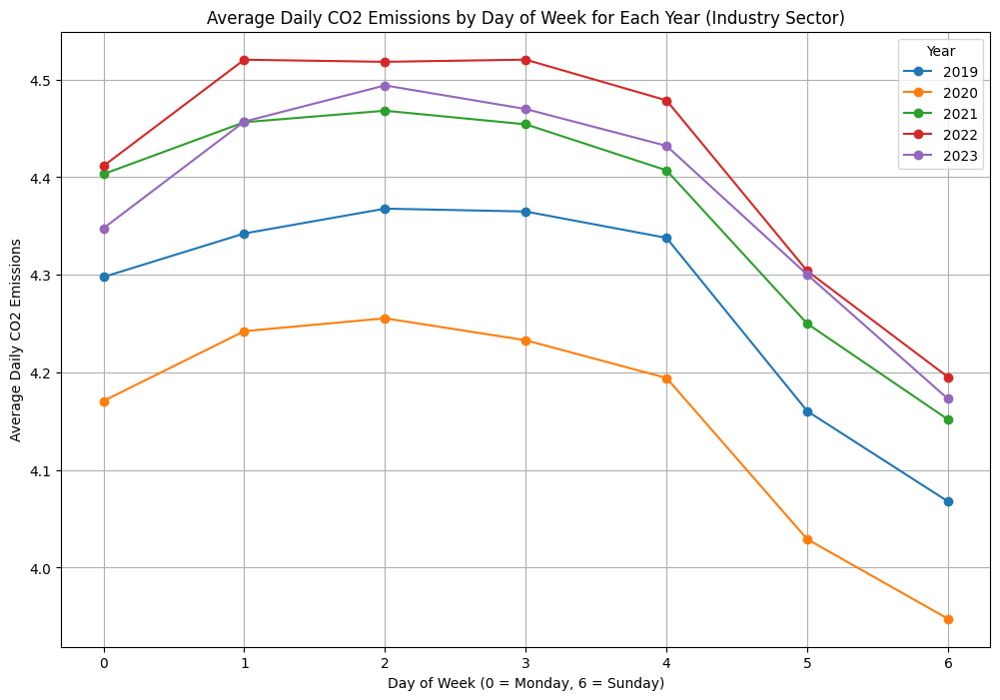

In [ ]:
# Aggregate average daily CO2 emissions by day of week and year for the Ground Transport sector
avg_daily_emissions_day_of_week_industry = data[data['sector'] == 'Industry'].groupby(['Year', 'day_of_week'])['value'].mean().unstack()

# Plot average daily CO2 emissions by day of week for each year for the Power sector
plt.figure(figsize=(12, 8))

for year in avg_daily_emissions_day_of_week_industry.index:
    plt.plot(avg_daily_emissions_day_of_week_industry.columns, avg_daily_emissions_day_of_week_industry.loc[year], marker='o', label=year)

plt.title('Average Daily CO2 Emissions by Day of Week for Each Year (Industry Sector)')
plt.xlabel('Day of Week (0 = Monday, 6 = Sunday)')
plt.ylabel('Average Daily CO2 Emissions')
plt.xticks(range(7))
plt.legend(title='Year')
plt.grid(True)
plt.show()

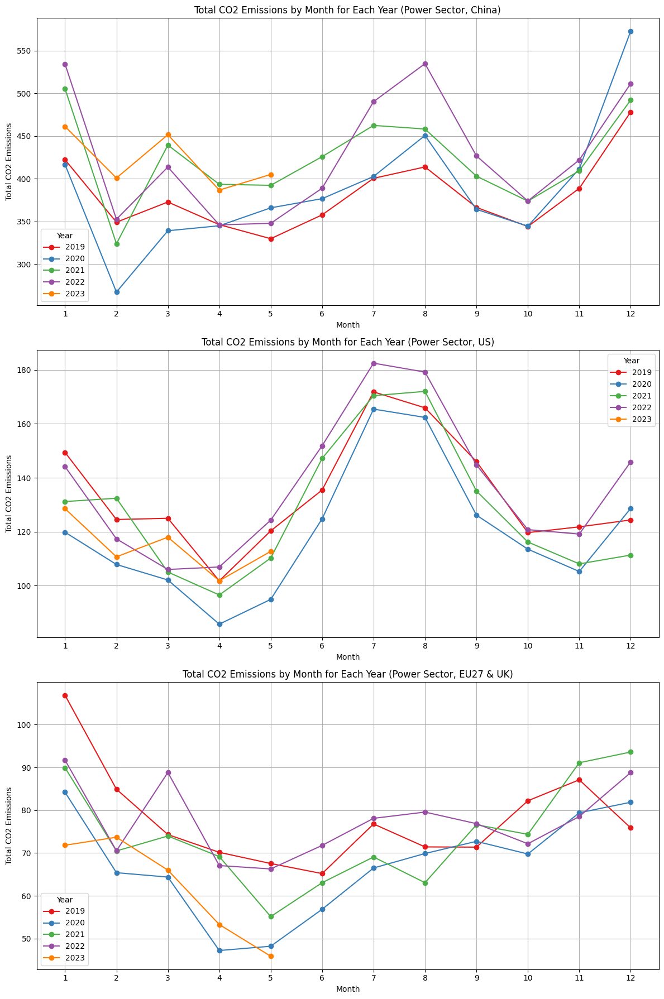

In [ ]:
# Create a 'month' column for easy monthly aggregation
data['month'] = data['date'].dt.month
# Aggregate total CO2 emissions by year, month, and country for the Power sector
total_emissions_year_month_power = data[data['sector'] == 'Power'].groupby(['Year', 'month', 'country'])['value'].sum().unstack()

# Separate DataFrames for each top country
total_emissions_year_month_power_china = total_emissions_year_month_power['China'].unstack()
total_emissions_year_month_power_us = total_emissions_year_month_power['US'].unstack()
total_emissions_year_month_power_eu27_uk = total_emissions_year_month_power['EU27 & UK'].unstack()

# Choose a different color palette for the line plots
color_palette = plt.cm.Set1.colors

# Plot total CO2 emissions by month for each year for each top country in the Power sector
fig, axs = plt.subplots(3, 1, figsize=(12, 18))

# China
for i, year in enumerate(total_emissions_year_month_power_china.index):
    axs[0].plot(total_emissions_year_month_power_china.columns, total_emissions_year_month_power_china.loc[year],
                marker='o', label=year, color=color_palette[i])
axs[0].set_title('Total CO2 Emissions by Month for Each Year (Power Sector, China)')
axs[0].set_xlabel('Month')
axs[0].set_ylabel('Total CO2 Emissions')
axs[0].set_xticks(range(1, 13))
axs[0].legend(title='Year')
axs[0].grid(True)

# US
for i, year in enumerate(total_emissions_year_month_power_us.index):
    axs[1].plot(total_emissions_year_month_power_us.columns, total_emissions_year_month_power_us.loc[year],
                marker='o', label=year, color=color_palette[i])
axs[1].set_title('Total CO2 Emissions by Month for Each Year (Power Sector, US)')
axs[1].set_xlabel('Month')
axs[1].set_ylabel('Total CO2 Emissions')
axs[1].set_xticks(range(1, 13))
axs[1].legend(title='Year')
axs[1].grid(True)

# EU27 & UK
for i, year in enumerate(total_emissions_year_month_power_eu27_uk.index):
    axs[2].plot(total_emissions_year_month_power_eu27_uk.columns, total_emissions_year_month_power_eu27_uk.loc[year],
                marker='o', label=year, color=color_palette[i])
axs[2].set_title('Total CO2 Emissions by Month for Each Year (Power Sector, EU27 & UK)')
axs[2].set_xlabel('Month')
axs[2].set_ylabel('Total CO2 Emissions')
axs[2].set_xticks(range(1, 13))
axs[2].legend(title='Year')
axs[2].grid(True)

plt.tight_layout()
plt.show()

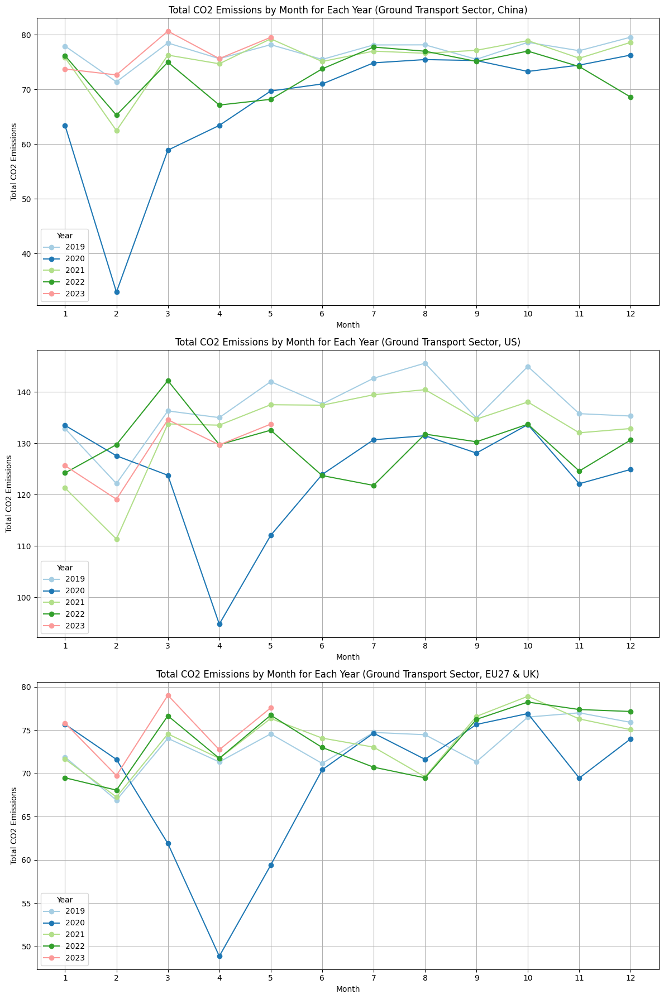

In [ ]:
# Aggregate total CO2 emissions by year, month, and country for the Ground Transport sector
total_emissions_year_month_ground_transport = data[data['sector'] == 'Ground Transport'].groupby(['Year', 'month', 'country'])['value'].sum().unstack()

# Separate DataFrames for each top country
total_emissions_year_month_ground_transport_china = total_emissions_year_month_ground_transport['China'].unstack()
total_emissions_year_month_ground_transport_us = total_emissions_year_month_ground_transport['US'].unstack()
total_emissions_year_month_ground_transport_eu27_uk = total_emissions_year_month_ground_transport['EU27 & UK'].unstack()

# Choose a different color palette for the line plots
color_palette = plt.cm.Paired.colors

# Plot total CO2 emissions by month for each year for each top country in the Ground Transport sector
fig, axs = plt.subplots(3, 1, figsize=(12, 18))

# China
for i, year in enumerate(total_emissions_year_month_ground_transport_china.index):
    axs[0].plot(total_emissions_year_month_ground_transport_china.columns, total_emissions_year_month_ground_transport_china.loc[year],
                marker='o', label=year, color=color_palette[i])
axs[0].set_title('Total CO2 Emissions by Month for Each Year (Ground Transport Sector, China)')
axs[0].set_xlabel('Month')
axs[0].set_ylabel('Total CO2 Emissions')
axs[0].set_xticks(range(1, 13))
axs[0].legend(title='Year')
axs[0].grid(True)

# US
for i, year in enumerate(total_emissions_year_month_ground_transport_us.index):
    axs[1].plot(total_emissions_year_month_ground_transport_us.columns, total_emissions_year_month_ground_transport_us.loc[year],
                marker='o', label=year, color=color_palette[i])
axs[1].set_title('Total CO2 Emissions by Month for Each Year (Ground Transport Sector, US)')
axs[1].set_xlabel('Month')
axs[1].set_ylabel('Total CO2 Emissions')
axs[1].set_xticks(range(1, 13))
axs[1].legend(title='Year')
axs[1].grid(True)

# EU27 & UK
for i, year in enumerate(total_emissions_year_month_ground_transport_eu27_uk.index):
    axs[2].plot(total_emissions_year_month_ground_transport_eu27_uk.columns, total_emissions_year_month_ground_transport_eu27_uk.loc[year],
                marker='o', label=year, color=color_palette[i])
axs[2].set_title('Total CO2 Emissions by Month for Each Year (Ground Transport Sector, EU27 & UK)')
axs[2].set_xlabel('Month')
axs[2].set_ylabel('Total CO2 Emissions')
axs[2].set_xticks(range(1, 13))
axs[2].legend(title='Year')
axs[2].grid(True)

plt.tight_layout()
plt.show()

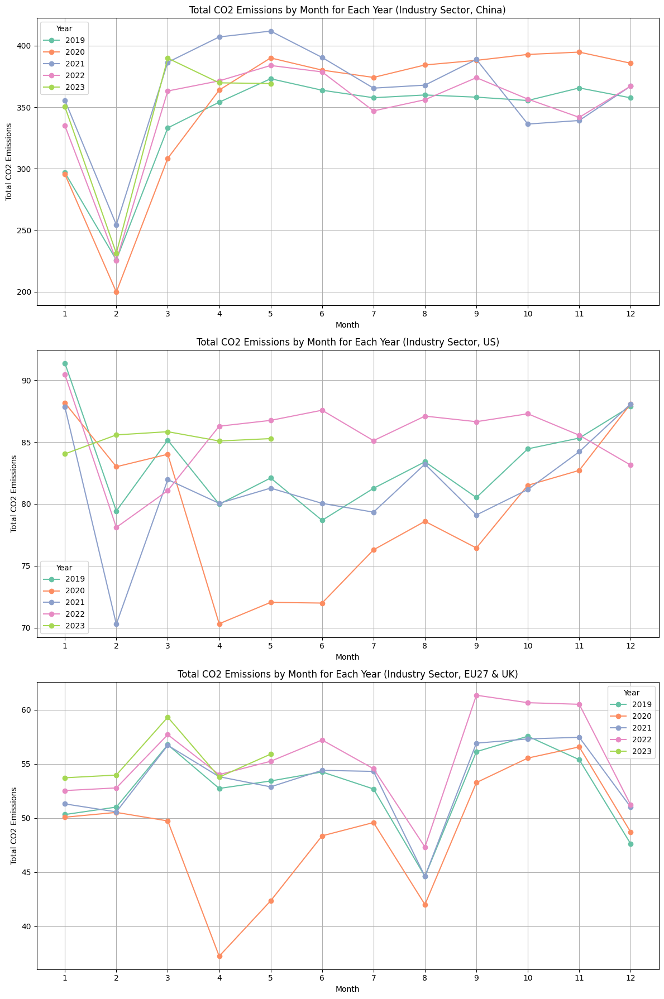

In [ ]:
# Aggregate total CO2 emissions by year, month, and country for the Industry sector
total_emissions_year_month_industry = data[data['sector'] == 'Industry'].groupby(['Year', 'month', 'country'])['value'].sum().unstack()

# Separate DataFrames for each top country
total_emissions_year_month_industry_china = total_emissions_year_month_industry['China'].unstack()
total_emissions_year_month_industry_us = total_emissions_year_month_industry['US'].unstack()
total_emissions_year_month_industry_eu27_uk = total_emissions_year_month_industry['EU27 & UK'].unstack()

# Choose a different color palette for the line plots
color_palette = plt.cm.Set2.colors

# Plot total CO2 emissions by month for each year for each top country in the Industry sector
fig, axs = plt.subplots(3, 1, figsize=(12, 18))

# China
for i, year in enumerate(total_emissions_year_month_industry_china.index):
    axs[0].plot(total_emissions_year_month_industry_china.columns, total_emissions_year_month_industry_china.loc[year],
                marker='o', label=year, color=color_palette[i])
axs[0].set_title('Total CO2 Emissions by Month for Each Year (Industry Sector, China)')
axs[0].set_xlabel('Month')
axs[0].set_ylabel('Total CO2 Emissions')
axs[0].set_xticks(range(1, 13))
axs[0].legend(title='Year')
axs[0].grid(True)

# US
for i, year in enumerate(total_emissions_year_month_industry_us.index):
    axs[1].plot(total_emissions_year_month_industry_us.columns, total_emissions_year_month_industry_us.loc[year],
                marker='o', label=year, color=color_palette[i])
axs[1].set_title('Total CO2 Emissions by Month for Each Year (Industry Sector, US)')
axs[1].set_xlabel('Month')
axs[1].set_ylabel('Total CO2 Emissions')
axs[1].set_xticks(range(1, 13))
axs[1].legend(title='Year')
axs[1].grid(True)

# EU27 & UK
for i, year in enumerate(total_emissions_year_month_industry_eu27_uk.index):
    axs[2].plot(total_emissions_year_month_industry_eu27_uk.columns, total_emissions_year_month_industry_eu27_uk.loc[year],
                marker='o', label=year, color=color_palette[i])
axs[2].set_title('Total CO2 Emissions by Month for Each Year (Industry Sector, EU27 & UK)')
axs[2].set_xlabel('Month')
axs[2].set_ylabel('Total CO2 Emissions')
axs[2].set_xticks(range(1, 13))
axs[2].legend(title='Year')
axs[2].grid(True)

plt.tight_layout()
plt.show()

<ipython-input-52-6dfc69ca86aa>:10: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



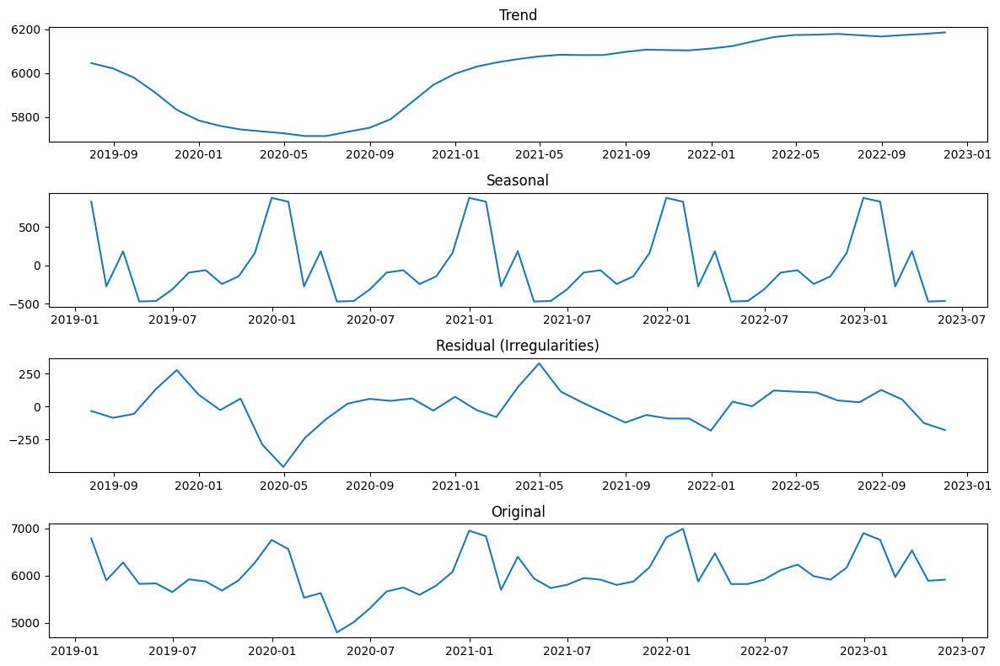

In [ ]:
import pandas as pd
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

# Assuming your dataframe is named df
data['date'] = pd.to_datetime(data['date'], format='%d/%m/%Y')
data.set_index('date', inplace=True)

# Resample data to monthly frequency (adjust as needed)
df_resampled = data.resample('M').sum()

# Time series decomposition
result = seasonal_decompose(df_resampled['value'], model='additive', period=12)  # Assuming monthly data, set period accordingly

# Plotting the components
plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
plt.plot(result.trend, label='Trend')
plt.title('Trend')

plt.subplot(4, 1, 2)
plt.plot(result.seasonal, label='Seasonal')
plt.title('Seasonal')

plt.subplot(4, 1, 3)
plt.plot(result.resid, label='Residual')
plt.title('Residual (Irregularities)')

plt.subplot(4, 1, 4)
plt.plot(df_resampled['value'], label='Original')
plt.title('Original')

plt.tight_layout()
plt.show()

In [1]:
import pandas as pd
data1 = pd.read_csv("/content/IEA-EV-dataEV salesCarsHistorical.csv")

In [2]:
data1

,region,category,parameter,mode,powertrain,year,unit,value
0,Australia,Historical,EV sales,Cars,BEV,2011,Vehicles,49
1,Australia,Historical,EV sales,Cars,BEV,2012,Vehicles,170
2,Australia,Historical,EV sales,Cars,PHEV,2012,Vehicles,80
3,Australia,Historical,EV sales,Cars,PHEV,2013,Vehicles,100
4,Australia,Historical,EV sales,Cars,BEV,2013,Vehicles,190
...,...,...,...,...,...,...,...,...
829,World,Historical,EV sales,Cars,PHEV,2020,Vehicles,970000
830,World,Historical,EV sales,Cars,PHEV,2021,Vehicles,1900000
831,World,Historical,EV sales,Cars,BEV,2021,Vehicles,4600000
832,World,Historical,EV sales,Cars,BEV,2022,Vehicles,7300000


In [4]:
# Create the subdataset
subdataset = data1[(data1['region'] == 'Australia') & (data1['powertrain'] == 'BEV')]
# Display the subdataset
print(subdataset)

       region    category parameter  mode powertrain  year      unit  value
0   Australia  Historical  EV sales  Cars        BEV  2011  Vehicles     49
1   Australia  Historical  EV sales  Cars        BEV  2012  Vehicles    170
4   Australia  Historical  EV sales  Cars        BEV  2013  Vehicles    190
5   Australia  Historical  EV sales  Cars        BEV  2014  Vehicles    370
8   Australia  Historical  EV sales  Cars        BEV  2015  Vehicles    760
9   Australia  Historical  EV sales  Cars        BEV  2016  Vehicles    670
12  Australia  Historical  EV sales  Cars        BEV  2017  Vehicles   1200
13  Australia  Historical  EV sales  Cars        BEV  2018  Vehicles   1800
16  Australia  Historical  EV sales  Cars        BEV  2019  Vehicles   6300
17  Australia  Historical  EV sales  Cars        BEV  2020  Vehicles   5200
20  Australia  Historical  EV sales  Cars        BEV  2021  Vehicles  17000
21  Australia  Historical  EV sales  Cars        BEV  2022  Vehicles  33000


In [ ]:
# Convert the 'date' column to datetime format
subdataset['date'] = pd.to_datetime(subdataset['date'], format='%d/%m/%Y')

# Extract month and year from the 'date' column
subdataset['month'] = subdataset['date'].dt.month
subdataset['year'] = subdataset['date'].dt.year

# Group by year and month, and calculate the mean for each group
mean_co2_monthly1 = subdataset.groupby(['year', 'month'])['value'].sum().reset_index()

# Display the mean CO2 values month-wise
print(mean_co2_monthly1)

    year  month      value
0   2019      1  53.769860
1   2019      2  47.227380
2   2019      3  44.187880
3   2019      4  37.894819
4   2019      5  34.716604
5   2019      6  37.895402
6   2019      7  44.298660
7   2019      8  49.839270
8   2019      9  44.411610
9   2019     10  40.093476
10  2019     11  40.835560
11  2019     12  49.369470
12  2020      1  50.689490
13  2020      2  46.309630
14  2020      3  42.815410
15  2020      4  34.616904
16  2020      5  30.402354
17  2020      6  37.006353
18  2020      7  41.430550
19  2020      8  50.953710
20  2020      9  44.356260
21  2020     10  41.076190
22  2020     11  42.878120
23  2020     12  54.296870
24  2021      1  57.253340
25  2021      2  45.854730
26  2021      3  41.657340
27  2021      4  33.082752
28  2021      5  31.175771
29  2021      6  35.888061
30  2021      7  43.881300
31  2021      8  43.911763
32  2021      9  36.854469
33  2021     10  38.689483
34  2021     11  40.618320
35  2021     12  48.937060
3

<ipython-input-55-1a4b1db4d68c>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-55-1a4b1db4d68c>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-55-1a4b1db4d68c>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
from statsmodels.tsa.api import ExponentialSmoothing
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import STL

In [ ]:
# Generate test data for prediction
X_test_combined = pd.DataFrame({'year': [2023,2023,2023,2023,2023,2023,2023,2024,2024,2024,2024,2024,2024,2024,2024,2024,2024],
                                'month': [6,7,8,9,10,11,12,1,2,3,4,5,6,7,8,9,10]})  # Example: predicting for June 2023

In [ ]:
pip install pmdarima

In [ ]:
import pmdarima as pm
from pmdarima.model_selection import train_test_split


train, test = train_test_split(mean_co2_monthly1['value'])
p_values = range(0, 6)
d_values = [1]
q_values = range(0, 2)

best_aic = float('inf')
best_bic = float('inf')
best_order_aic = None
best_order_bic = None

for p in p_values:
    for q in q_values:
        try:
            arima_model = pm.ARIMA(order=order, suppress_warnings=True)
            arima_model.fit(train)
            aic = arima_model.aic()
            bic = arima_model.bic()
            if aic < best_aic:
                best_aic = aic
                best_order_aic = order
            if bic < best_bic:
                best_bic = bic
                best_order_bic = order

        except Exception as e:
            continue

print(f"Best order (AIC): {best_order_aic} with AIC: {best_aic}")
print(f"Best order (BIC): {best_order_bic} with BIC: {best_bic}")
final_arima_model_aic = pm.ARIMA(order=best_order_aic, suppress_warnings=True)
final_arima_model_aic.fit(train)
final_arima_model_bic = pm.ARIMA(order=best_order_bic, suppress_warnings=True)
final_arima_model_bic.fit(train)
arima_predictions_aic = final_arima_model_aic.predict(n_periods=len(test))
arima_predictions_bic = final_arima_model_bic.predict(n_periods=len(test))

Best order (AIC): (2, 1, 1) with AIC: 230.433595257883
Best order (BIC): (2, 1, 1) with BIC: 238.62152605651494


In [ ]:
from sklearn.metrics import mean_absolute_error, r2_score, explained_variance_score, mean_squared_error
from math import sqrt
# Assuming 'arima_predictions' is your ARIMA model predictions and 'y_true' is the true values
# Replace 'arima_predictions_aic' or 'arima_predictions_bic' with the appropriate variable if needed

# Mean Absolute Error (MAE)
mae = mean_absolute_error(test, arima_predictions_aic)
print(f"Mean Absolute Error (MAE): {mae}")

# R-squared (R2) Score
r2 = r2_score(test, arima_predictions_aic)
print(f"R-squared (R2) Score: {r2}")

# Explained Variance Score
explained_var = explained_variance_score(test, arima_predictions_aic)
print(f"Explained Variance Score: {explained_var}")

# Mean Squared Error (MSE)
mse = mean_squared_error(test, arima_predictions_aic)
print(f"Mean Squared Error (MSE): {mse}")

# Mean Squared Error (MSE)
rmse = sqrt(mean_squared_error(test, arima_predictions_aic))
print(f"Root Mean Squared Error (MSE): {rmse}")

Mean Absolute Error (MAE): 5.515746561574026
R-squared (R2) Score: 0.07240645660002609
Explained Variance Score: 0.13929145046162505
Mean Squared Error (MSE): 41.85034226221678
Root Mean Squared Error (MSE): 6.4691840491840065


In [ ]:
# ARIMA model
arima_model = ARIMA(mean_co2_monthly1['value'], order=(2, 1, 1))
arima_result = arima_model.fit()
arima_predictions = arima_result.predict(start=len(mean_co2_monthly1), end=len(mean_co2_monthly1) + len(X_test_combined) - 1,
                                         typ='levels')

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning:

Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.



In [ ]:
arima_predictions

53    41.643275
54    48.979182
55    49.783872
56    45.439281
57    40.442095
58    38.405002
59    39.846098
60    42.750042
61    44.696802
62    44.637436
63    43.206181
64    41.788390
65    41.350277
66    41.901756
67    42.772630
68    43.272447
69    43.168978
Name: predicted_mean, dtype: float64

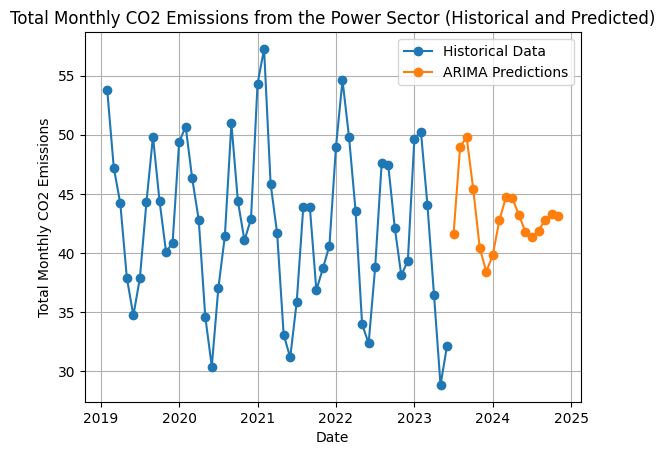

In [ ]:
import matplotlib.pyplot as plt
# Plot historical data
plt.plot(mean_co2_monthly1['year'] + mean_co2_monthly1['month'] / 12, mean_co2_monthly1['value'], label='Historical Data', marker='o')

# Plot predictions
plt.plot(X_test_combined['year'] + X_test_combined['month'] / 12, arima_predictions, label='ARIMA Predictions', marker='o')

plt.title('Total Monthly CO2 Emissions from the Power Sector (Historical and Predicted)')
plt.xlabel('Date')
plt.ylabel('Total Monthly CO2 Emissions')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
import itertools
import pandas as pd
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
from math import sqrt

# Assuming mean_co2_monthly1['value'] contains your time series data
# Split data into training and testing sets
train_size = int(len(mean_co2_monthly1) * 0.8)
train, test = mean_co2_monthly1.iloc[:train_size], mean_co2_monthly1.iloc[train_size:]

# Define the range of values for p, d, q, P, D, Q, and m
p = d = q = range(0, 3)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
best_params = None
best_aic = float('inf')
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(train['value'],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit(disp=False)
            # Calculate AIC (Akaike Information Criterion)
            aic = results.aic
            # Update best parameters if current model has lower AIC
            if aic < best_aic:
                best_aic = aic
                best_params = (param, param_seasonal)
        except:
            continue
# Fit the SARIMA model with the best parameters on the entire training set
best_sarima_model = sm.tsa.statespace.SARIMAX(mean_co2_monthly1['value'],
                                              order=best_params[0],
                                              seasonal_order=best_params[1],
                                              enforce_stationarity=False,
                                              enforce_invertibility=False)
best_sarima_result = best_sarima_model.fit(disp=False)

# Make predictions on the test set
sarima_predictions = best_sarima_result.get_forecast(steps=len(test))

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for

In [ ]:
# Evaluate the model performance
rmse = sqrt(mean_squared_error(test['value'], sarima_predictions.predicted_mean)
)
print(f'Root Mean Squared Error (RMSE): {rmse}')
mae = mean_absolute_error(test['value'], sarima_predictions.predicted_mean)
print(f"Mean Absolute Error (MAE): {mae}")

# R-squared (R2) Score
r2 = r2_score(test['value'], sarima_predictions.predicted_mean)
print(f"R-squared (R2) Score: {r2}")

# Explained Variance Score
explained_var = explained_variance_score(test['value'], sarima_predictions.
                                         predicted_mean)
print(f"Explained Variance Score: {explained_var}")

# Mean Squared Error (MSE)
mse = mean_squared_error(test['value'], sarima_predictions.predicted_mean)
print(f"Mean Squared Error (MSE): {mse}")
# Print the best parameters
print(f'Best SARIMA parameters: {best_params}')

Root Mean Squared Error (RMSE): 6.162645552532185
Mean Absolute Error (MAE): 5.196269227160379
R-squared (R2) Score: 0.1840902200509077
Explained Variance Score: 0.3917244581250956
Mean Squared Error (MSE): 37.97820020614471
Best SARIMA parameters: ((2, 0, 1), (2, 1, 2, 12))


In [ ]:
# SARIMA model
sarima_model = SARIMAX(mean_co2_monthly1['value'], order=(2, 0, 1), seasonal_order=(2, 1, 2, 12))
sarima_result = sarima_model.fit(disp=False)
sarima_predictions = sarima_result.get_forecast(steps=len(X_test_combined))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.



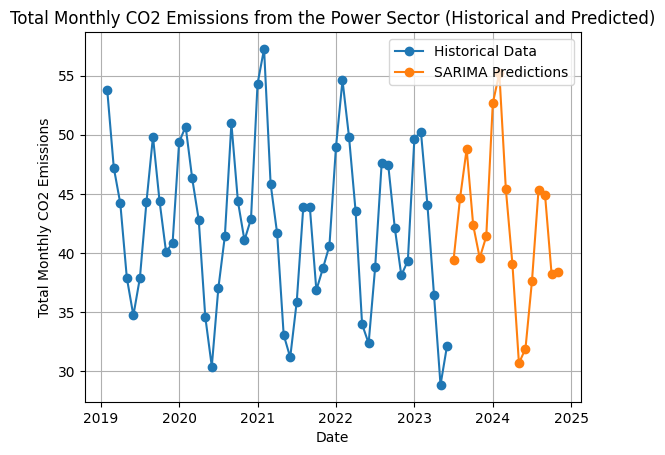

In [ ]:
import matplotlib.pyplot as plt
# Plot historical data
plt.plot(mean_co2_monthly1['year'] + mean_co2_monthly1['month'] / 12, mean_co2_monthly1['value'], label='Historical Data',
         marker='o')

# Plot predictions
plt.plot(X_test_combined['year'] + X_test_combined['month'] / 12, sarima_predictions.predicted_mean,
         label='SARIMA Predictions', marker='o')

plt.title('Total Monthly CO2 Emissions from the Power Sector (Historical and Predicted)')
plt.xlabel('Date')
plt.ylabel('Total Monthly CO2 Emissions')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
import numpy as np
import pandas as pd
from statsmodels.tsa.seasonal import STL
from sklearn.metrics import mean_squared_error

mean_co2_monthly1['date'] = pd.to_datetime(mean_co2_monthly1[['year', 'month']]
                                           .assign(day=1))

mean_co2_monthly1.set_index('date', inplace=True)
seasonal_values = [3,5, 7, 9, 11,13,15,17,19,21,23,25,27, 29]


best_seasonal = None
best_mse = float('inf')

# Loop through different seasonal values and perform STL decomposition
for seasonal in seasonal_values:
    stl_model = STL(mean_co2_monthly1['value'], seasonal=seasonal, period=12)
    stl_result = stl_model.fit()
    stl_trend = stl_result.trend
    stl_seasonal = stl_result.seasonal
    stl_residual = stl_result.resid

    # Use the components to reconstruct the time series
    stl_predictions = stl_trend + stl_seasonal + stl_residual

    # Evaluate the model using Mean Squared Error
    mse = mean_squared_error(mean_co2_monthly1['value'], stl_predictions)

    # Update the best hyperparameters if the current model performs better
    if mse < best_mse:
        best_mse = mse
        best_seasonal = seasonal

# Print the best hyperparameters
print("Best Seasonal Value:", best_seasonal)

Best Seasonal Value: 25
Best MSE: 1.1907334418430368e-30


In [ ]:
# Evaluate the model performance
rmse = sqrt(mean_squared_error(mean_co2_monthly1['value'], stl_predictions))
print(f'Root Mean Squared Error (RMSE): {rmse}')
mae = mean_absolute_error(mean_co2_monthly1['value'], stl_predictions)
print(f"Mean Absolute Error (MAE): {mae}")

# R-squared (R2) Score
r2 = r2_score(mean_co2_monthly1['value'], stl_predictions)
print(f"R-squared (R2) Score: {r2}")

# Explained Variance Score
explained_var = explained_variance_score(mean_co2_monthly1['value'], stl_predictions)
print(f"Explained Variance Score: {explained_var}")

# Mean Squared Error (MSE)
mse = mean_squared_error(mean_co2_monthly1['value'], stl_predictions)
print(f"Mean Squared Error (MSE): {mse}")

Root Mean Squared Error (RMSE): 1.4640082634047754e-15
Mean Absolute Error (MAE): 3.3516166781136804e-16
R-squared (R2) Score: 1.0
Explained Variance Score: 1.0
Mean Squared Error (MSE): 2.143320195317466e-30


In [ ]:
# STL model
stl_model = STL(mean_co2_monthly1['value'], seasonal=25, period=12)
stl_result = stl_model.fit()
stl_trend = stl_result.trend
stl_seasonal = stl_result.seasonal
stl_residual = stl_result.resid

# Use the components to reconstruct the time series
stl_predictions = stl_trend + stl_seasonal + stl_residual

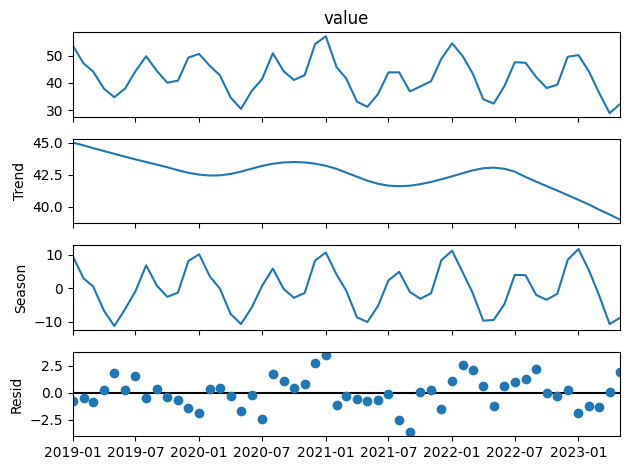

In [ ]:
fig = stl_result.plot()

In [ ]:
# If you want to forecast future values, you can extend the components accordingly
future_steps = len(X_test_combined)

# Create the 'date' column in mean_co2_monthly1
mean_co2_monthly1['date'] = pd.to_datetime(mean_co2_monthly1[['year', 'month']].assign(day=1))

# Get the last date in the historical data
last_date = mean_co2_monthly1['date'].max()

# Create the future index
future_index = pd.date_range(start=last_date + pd.DateOffset(months=1), periods=future_steps, freq='M')

# Calculate future trend and other components
stl_future_trend = stl_trend.iloc[-1] + np.arange(1, future_steps + 1) * (stl_trend.iloc[-1] - stl_trend.iloc[-2])
stl_future_seasonal = stl_seasonal.iloc[:future_steps]
stl_future_residual = stl_residual.iloc[:future_steps]

# Combine the components for future predictions
stl_future_predictions = stl_future_trend + stl_future_seasonal + stl_future_residual

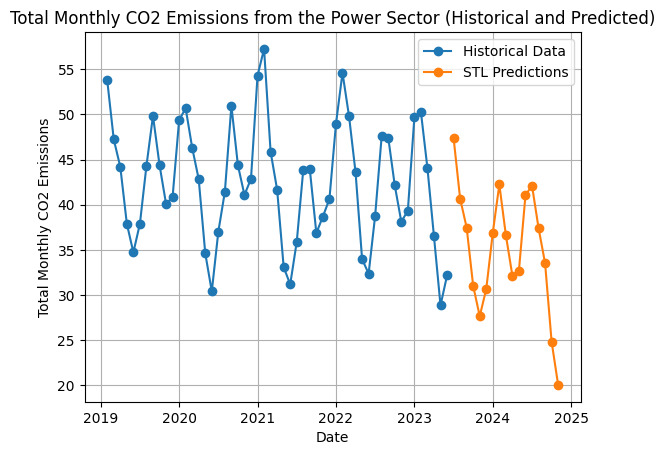

In [ ]:
import matplotlib.pyplot as plt
# Plot historical data
plt.plot(mean_co2_monthly1['year'] + mean_co2_monthly1['month'] / 12, mean_co2_monthly1['value'], label='Historical Data',
         marker='o')

# Plot predictions
plt.plot(X_test_combined['year'] + X_test_combined['month'] / 12, stl_future_predictions, label='STL Predictions', marker='o')

plt.title('Total Monthly CO2 Emissions from the Power Sector (Historical and Predicted)')
plt.xlabel('Date')
plt.ylabel('Total Monthly CO2 Emissions')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error
from math import sqrt

# Assuming mean_co2_monthly1['value'] contains your time series data

# Split data into training and testing sets
train_size = int(len(mean_co2_monthly1) * 0.8)
train, test = mean_co2_monthly1.iloc[:train_size], mean_co2_monthly1.iloc[train_size:train_size+len(X_test_combined)]

# Define the range of values for smoothing parameters
alpha_values = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
beta_values = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
gamma_values = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

best_params = None
best_rmse = float('inf')

# Perform grid search to find the best smoothing parameters
for alpha in alpha_values:
    for beta in beta_values:
        for gamma in gamma_values:
            ets_model = ExponentialSmoothing(train['value'], trend='add', seasonal='add', seasonal_periods=12,
                                             initialization_method="estimated",
                                             initial_level=None, initial_trend=None, initial_seasonal=None,
                                             use_boxcox=False, dates=None, freq=None,
                                             missing='none')
            ets_result = ets_model.fit(smoothing_level=alpha, smoothing_trend=beta, smoothing_seasonal=gamma)
            ets_predictions = ets_result.forecast(steps=len(test))
            rmse = sqrt(mean_squared_error(test['value'], ets_predictions))
            if rmse < best_rmse:
                best_rmse = rmse
                best_params = (alpha, beta, gamma)
best_ets_model = ExponentialSmoothing(mean_co2_monthly1['value'], trend='add', seasonal='add', seasonal_periods=12,
                                       initialization_method="estimated",
                                       initial_level=None, initial_trend=None, initial_seasonal=None,
                                       use_boxcox=False,  dates=None, freq=None,
                                       missing='none')
best_ets_result = best_ets_model.fit(smoothing_level=best_params[0], smoothing_trend=best_params[1], smoothing_seasonal=best_params[2])
best_ets_predictions = best_ets_result.forecast(steps=len(mean_co2_monthly1))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so

Best ETS smoothing parameters: Alpha=0.3, Beta=0.9, Gamma=0.3
Root Mean Squared Error (RMSE) on Test Set: 2.2576279998402287


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



In [ ]:
# Print the best smoothing parameters and RMSE on the test set
print(f'Best ETS smoothing parameters: Alpha={best_params[0]}, Beta={best_params[1]}, Gamma={best_params[2]}')

Best ETS smoothing parameters: Alpha=0.3, Beta=0.9, Gamma=0.3
Root Mean Squared Error (RMSE) on Test Set: 2.2576279998402287


In [ ]:
from math import sqrt
# Evaluate the model performance
rmse = sqrt(mean_squared_error(test['value'], ets_predictions))
print(f'Root Mean Squared Error (RMSE): {rmse}')
mae = mean_absolute_error(test['value'], ets_predictions)
print(f"Mean Absolute Error (MAE): {mae}")

# R-squared (R2) Score
r2 = r2_score(test['value'], ets_predictions)
print(f"R-squared (R2) Score: {(r2)}")

# Explained Variance Score
explained_var = explained_variance_score(test['value'], ets_predictions)
print(f"Explained Variance Score: {explained_var}")

# Mean Squared Error (MSE)
mse = mean_squared_error(test['value'], ets_predictions)
print(f"Mean Squared Error (MSE): {mse}")

Root Mean Squared Error (RMSE): 11.960829675163769
Mean Absolute Error (MAE): 10.613793212591226
R-squared (R2) Score: 0.07347985724298756
Explained Variance Score: 0.3467075862557283
Mean Squared Error (MSE): 143.06144651827825


In [ ]:
# ETS model
ets_model = ExponentialSmoothing(mean_co2_monthly1['value'], trend='add', seasonal='add', seasonal_periods=12)
ets_result = ets_model.fit(smoothing_level=0.3, smoothing_trend=0.9, smoothing_seasonal=0.3)
ets_predictions = ets_result.forecast(steps=len(X_test_combined))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



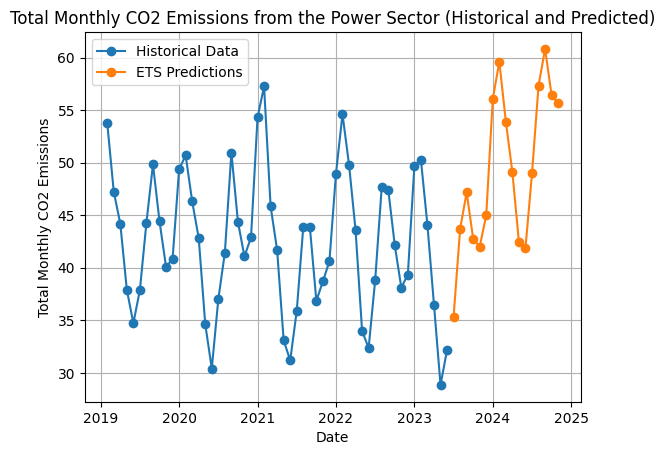

In [ ]:
import matplotlib.pyplot as plt
# Plot historical data
plt.plot(mean_co2_monthly1['year'] + mean_co2_monthly1['month'] / 12, mean_co2_monthly1['value'], label='Historical Data',
         marker='o')

# Plot predictions
plt.plot(X_test_combined['year'] + X_test_combined['month'] / 12, ets_predictions, label='ETS Predictions',
         marker='o')

plt.title('Total Monthly CO2 Emissions from the Power Sector (Historical and Predicted)')
plt.xlabel('Date')
plt.ylabel('Total Monthly CO2 Emissions')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
import numpy as np
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import make_regression

# Split data into training and testing sets
train_size = int(len(mean_co2_monthly1) * 0.8)
X = mean_co2_monthly1[['year', 'month']]
y = mean_co2_monthly1['value']
# Define the kernel and parameter grid
kernel = C(1.0, (1e-3, 1e3)) * RBF(1.0, (1e-2, 1e2))
param_grid = {
    'kernel': [kernel],
    'alpha': np.logspace(-5, 2, 8),
}

# Create GaussianProcessRegressor
gpr = GaussianProcessRegressor()

# Perform grid search with cross-validation
grid_search = GridSearchCV(gpr, param_grid=param_grid, cv=5)
grid_search.fit(X, y)

# Print the best parameters and the corresponding mean cross-validated score
print("Best Parameters: ", grid_search.best_params_)
print("Best Score: {:.2f}".format(grid_search.best_score_))


/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.

/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.

/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 0.01. Decreasing the bound and calling fit again may find a better value.

/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning:

The optimal value found for dimensi

Best Parameters:  {'alpha': 10.0, 'kernel': 1**2 * RBF(length_scale=1)}
Best Score: 0.15


/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.

/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.

/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.

/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning:

The optimal value found for dimens

In [ ]:
# Print the best parameters and the corresponding mean cross-validated score
print("Best Parameters: ", grid_search.best_params_)

Best Parameters:  {'alpha': 10.0, 'kernel': 1**2 * RBF(length_scale=1)}
Best Score: 0.15


In [ ]:
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, ExpSineSquared
# Define the custom kernel with long term, medium term, short term, and periodic components
kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2)) \
         + C(1.0, (1e-3, 1e3)) * RBF(length_scale=0.1, length_scale_bounds=(1e-2, 1e2)) \
         + C(1.0, (1e-3, 1e3)) * RBF(length_scale=0.01, length_scale_bounds=(1e-2, 1e2)) \
         + C(1.0, (1e-2, 1e2)) * ExpSineSquared(length_scale=1.0, periodicity=1.0,
                                               periodicity_bounds=(1e-2, 1e2))

In [ ]:
# Create Gaussian Process Regressor with the custom kernel
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10, random_state=42)

# Fit the model to the training data
gp.fit(mean_co2_monthly1[['year', 'month']], mean_co2_monthly1['value'])

/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k1__k2__k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.

/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k1__k2__k2__length_scale is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.

/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k2__k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.



GaussianProcessRegressor(kernel=1**2 * RBF(length_scale=1) + 1**2 * RBF(length_scale=0.1) + 1**2 * RBF(length_scale=0.01) + 1**2 * ExpSineSquared(length_scale=1, periodicity=1),
                         n_restarts_optimizer=10, random_state=42)

In [ ]:
# Make predictions
y_pred, sigma = gp.predict(X_test_combined, return_std=True)

In [ ]:
y_pred

array([40.89080967, 49.50083892, 50.84558591, 46.0995158 , 41.95627783,
       42.92767505, 47.72320785, 43.96043313, 38.46031599, 31.82988479,
       28.13897086, 31.54220722, 40.97288191, 49.78279803, 52.44588855,
       49.7038759 , 46.35681307])

In [ ]:
# Display the prediction and uncertainty
#print(f'Predicted CO2 value for June 2023: {y_pred[0]:.2f} +/- {sigma[0]:.2f}')

In [ ]:
# Convert predictions and uncertainties to DataFrame
predictions = pd.DataFrame({'value': y_pred, 'sigma': sigma}, index=pd.to_datetime(X_test_combined[['year', 'month']].assign(day=1)))

In [ ]:
# Add a column named 'y_pred' to the dataset
X_test_combined['y_pred'] = gp.predict(X_test_combined[['year', 'month']])

# Display the updated DataFrame
print(X_test_combined)

    year  month     y_pred
0   2023      6  40.890810
1   2023      7  49.500839
2   2023      8  50.845586
3   2023      9  46.099516
4   2023     10  41.956278
5   2023     11  42.927675
6   2023     12  47.723208
7   2024      1  43.960433
8   2024      2  38.460316
9   2024      3  31.829885
10  2024      4  28.138971
11  2024      5  31.542207
12  2024      6  40.972882
13  2024      7  49.782798
14  2024      8  52.445889
15  2024      9  49.703876
16  2024     10  46.356813


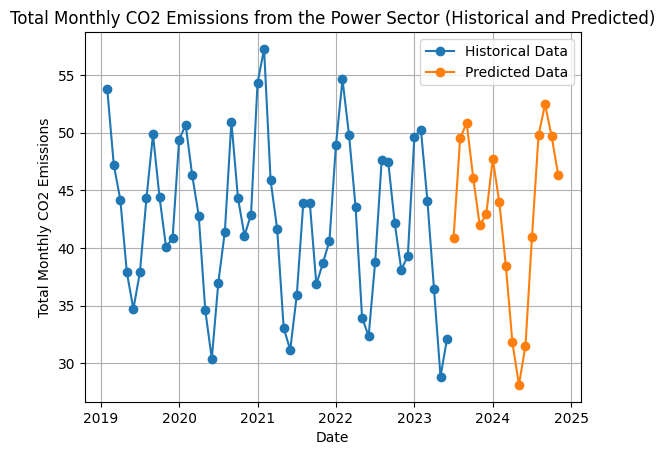

In [ ]:
import matplotlib.pyplot as plt
# Plot historical data
plt.plot(mean_co2_monthly1['year'] + mean_co2_monthly1['month'] / 12, mean_co2_monthly1['value'], label='Historical Data', marker='o')

# Plot predictions
plt.plot(X_test_combined['year'] + X_test_combined['month'] / 12, X_test_combined['y_pred'], label='Predicted Data', marker='o')

plt.title('Total Monthly CO2 Emissions from the Power Sector (Historical and Predicted)')
plt.xlabel('Date')
plt.ylabel('Total Monthly CO2 Emissions')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(mean_co2_monthly1[['year', 'month']], mean_co2_monthly1['value'], test_size=0.2)

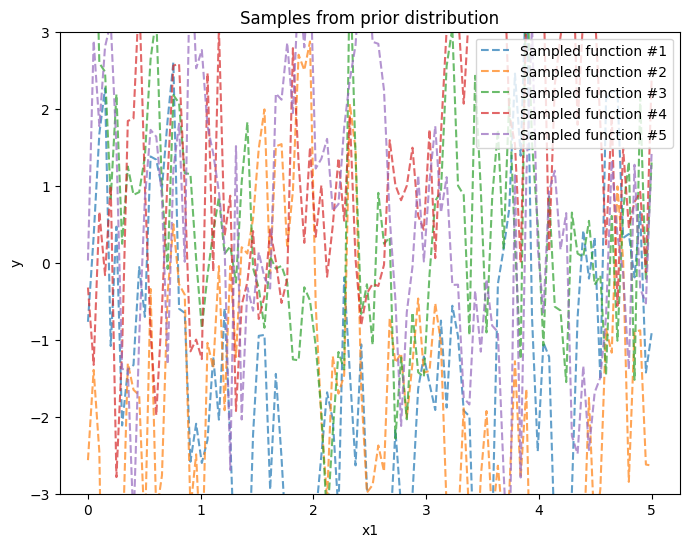

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.gaussian_process import GaussianProcessRegressor

def plot_prior_samples(gpr_model, n_samples, ax):
    """Plot samples drawn from the prior distribution of the Gaussian process model.

    Parameters
    ----------
    gpr_model : `GaussianProcessRegressor`
        A :class:`~sklearn.gaussian_process.GaussianProcessRegressor` model.
    n_samples : int
        The number of samples to draw from the prior Gaussian process distribution.
    ax : matplotlib axis
        The matplotlib axis where to plot the samples.
    """
    x1 = np.linspace(0, 5, 100)
    x2 = np.linspace(-2, 2, 100)
    X = np.column_stack((x1, x2))  # Ensure X has the correct shape with 2 features

    y_samples = gpr_model.sample_y(X, n_samples)

    for idx, single_prior in enumerate(y_samples.T):
        ax.plot(
            x1,
            single_prior,
            linestyle="--",
            alpha=0.7,
            label=f"Sampled function #{idx + 1}",
        )
    ax.set_xlabel("x1")
    ax.set_ylabel("y")
    ax.set_ylim([-3, 3])
    ax.set_title("Samples from prior distribution")
    ax.legend(loc="upper right")

# Example usage for plotting prior
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10, random_state=42)
fig, ax_prior = plt.subplots(figsize=(8, 6))
plot_prior_samples(gp, n_samples=5, ax=ax_prior)
plt.show()

In [ ]:
gp.fit(X_train,y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k1__k1__k2__k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.

/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k1__k1__k2__k2__length_scale is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.

/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k2__k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.



GaussianProcessRegressor(kernel=1**2 * RBF(length_scale=1) + 1**2 * RBF(length_scale=0.1) + 1**2 * RBF(length_scale=0.01) + 1**2 * ExpSineSquared(length_scale=1, periodicity=1),
                         n_restarts_optimizer=10, random_state=42)

In [ ]:
from sklearn.metrics import mean_squared_error
import numpy as np
# Make predictions on the test set
y_pred = gp.predict(X_test)
# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

In [ ]:
# Display the RMSE value
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')

Root Mean Squared Error (RMSE): 5.6749


In [ ]:
from sklearn.metrics import mean_absolute_error, r2_score, explained_variance_score

mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error (MSE): {mse:.4f}')
# Calculate Mean Absolute Error (MAE)

mae = mean_absolute_error(y_test, y_pred)
# Calculate R-squared (R2)
r2 = r2_score(y_test, y_pred)
# Calculate Explained Variance Score
explained_variance = explained_variance_score(y_test, y_pred)
# Display the evaluation metrics
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'R-squared (R2): {r2:.4f}')
print(f'Explained Variance Score: {explained_variance:.4f}')

 Mean Squared Error (MSE): 32.2043
Mean Absolute Error (MAE): 5.2846
R-squared (R2): 0.3081
Explained Variance Score: 0.3092
